In [ ]:
import os
import nibabel as nib
import numpy as np
from scipy.ndimage import gaussian_filter1d
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.signal import find_peaks
from scipy.interpolate import interp1d
from scipy.signal import correlate
from scipy.io import savemat
from scipy.spatial import cKDTree


In [ ]:

def get_bigbrain_layer_boundaries(subj_id, subj_surf_dir, subj_coord=None):
    """
    Get the cortical layer boundaries based on the Big Brain atlas for a specified coordinate
    in the subject's downsampled combined space. If subj_coord is None, this function returns
    the 6 proportional layer boundaries for every vertex in the downsampled mesh.

    Parameters
    ----------
    subj_id : str
        The subject identifier for which the conversion is being performed.
    subj_surf_dir : str
        The path containing the laMEG-processed subject surfaces.
    subj_coord : array-like or None, optional
        The x, y, z coordinates on the subject's combined hemisphere pial surface to be
        converted. If None, all downsampled pial vertices are mapped. Defaults to None.

    Returns
    -------
    vert_bb_prop : np.ndarray
        A 6 x M array of proportional layer boundaries (rows = 6 layer boundaries,
        columns = vertices), where M is the number of vertices in subj_coord (if provided)
        or in the downsampled mesh (if subj_coord is None). Values range between 0 and 1,
        which must be scaled by the cortical thickness to get layer depths in millimeters.
    """
    # Convert subject coordinate(s) to fsaverage vertex index
    hemi, fsave_v_idx = convert_native_to_fsaverage(subj_id, subj_surf_dir, subj_coord)

    # Retrieve or compute the Big Brain proportional layer boundaries
    # big_brain_proportional_layer_boundaries() is assumed to return a dict:
    #    {'lh': <6 x N_lh array>, 'rh': <6 x N_rh array>}
    bb_prop = big_brain_proportional_layer_boundaries()

    # If we only have a single coordinate, hemi will be a string; otherwise, it is a list of hemis
    if isinstance(hemi, str):
        # Single coordinate: just index directly
        vert_bb_prop = bb_prop[hemi][:, fsave_v_idx]
    else:
        # Multiple coordinates: build a 6 x M array
        vert_bb_prop = np.zeros((6, len(hemi)))
        for i, (v_h, idx) in enumerate(zip(hemi, fsave_v_idx)):
            vert_bb_prop[:, i] = bb_prop[v_h][:, idx]

    return vert_bb_prop

    
def big_brain_proportional_layer_boundaries(overwrite=False):
    """
    Get the proportional layer boundaries (6 values between 0 and 1) from the fsaverage-converted
    Big Brain atlas included in laMEG.

    This function uses the fsaverage-converted Big Brain cortical thickness atlas to calculate
    normalized distances between cortical layer boundaries (from layer 1 to layer 6) with values
    between 0 and 1. To speed up computation, the results are stored in a NumPy dictionary.

    Parameters
    ----------
    overwrite : bool
        Whether to overwrite the existing file.

    Returns
    -------
    bb_data : dict
        Dictionary with keys "lh" (left hemisphere) and "rh" (right hemisphere) containing arrays
        with layer boundaries for each vertex in the hemisphere.
    """

    asset_path = r"C:/Users/Danila/result/assets" # need to be set up 

    bbl_file = os.path.join(asset_path, "proportional_layer_boundaries.npy")
    
    if any([not os.path.exists(bbl_file), overwrite]):
        bb_l_paths = get_files(asset_path, "*.gii", strings=["tpl-fsaverage", "hemi-L"])
        bb_l_paths.sort()
        bb_r_paths = get_files(asset_path, "*.gii", strings=["tpl-fsaverage", "hemi-R"])
        bb_r_paths.sort()
        bb_data = {
            "lh": np.array([nib.load(p).agg_data() for p in bb_l_paths]),
            "rh": np.array([nib.load(p).agg_data() for p in bb_r_paths])
        }

        bb_data = {
           key: np.apply_along_axis(calc_prop, 0, value) for key, value in bb_data.items()
        }
        np.save(bbl_file, bb_data)
        return bb_data

    bb_data = np.load(bbl_file, allow_pickle=True).item()

    return bb_data

def convert_native_to_fsaverage(subj_id, subj_surf_dir, subj_coord=None):
    """
    Convert coordinates from a subject's native surface space to the fsaverage surface space.

    This function maps a vertex coordinate from a subject's native combined pial surface
    to the corresponding vertex index in the fsaverage template space. If no coordinate
    is provided, it maps all vertices in the subject's downsampled pial surface to fsaverage.

    Parameters
    ----------
    subj_id : str
        The subject identifier for which the conversion is being performed.
    subj_surf_dir : str
        The path containing the laMEG-processed subject surfaces.
    subj_coord : array-like, optional
        The x, y, z coordinates on the subject's combined hemisphere pial surface to be converted.
        If None, all downsampled pial vertices are mapped to fsaverage.

    Returns
    -------
    hemi : str or list of str
        The hemisphere(s) the vertex is found in ('lh' for left hemisphere, 'rh' for right
        hemisphere').
    fsave_v_idx : int or list of int
        Index or indices of the vertex on the fsaverage spherical surface that corresponds to the
        input coordinates.
    """
    fs_subjects_dir = os.getenv('SUBJECTS_DIR')
    fs_subject_dir = os.path.join(fs_subjects_dir, subj_id)

    # Prepare downsampled vertex coordinates
    if subj_coord is None:
        # Load downsampled surface
        subj_ds = nib.load(os.path.join(subj_surf_dir, 'pial.ds.gii'))
        ds_vertices = subj_ds.darrays[0].data
    else:
        ds_vertices = np.array([subj_coord])

    # Load full-resolution pial surfaces
    subj_lh = nib.load(os.path.join(subj_surf_dir, 'lh.pial.gii'))
    lh_vertices = subj_lh.darrays[0].data
    subj_rh = nib.load(os.path.join(subj_surf_dir, 'rh.pial.gii'))
    rh_vertices = subj_rh.darrays[0].data

    # KDTree for finding the closest full-resolution vertex
    lh_kdtree = cKDTree(lh_vertices)
    rh_kdtree = cKDTree(rh_vertices)

    # Get indices of vertices in full-resolution surface
    lh_dists, lh_pial_idx = lh_kdtree.query(ds_vertices, k=1)
    lh_pial_idx = np.squeeze(lh_pial_idx)
    rh_dists, rh_pial_idx = rh_kdtree.query(ds_vertices, k=1)
    rh_pial_idx = np.squeeze(rh_pial_idx)

    # Assign each vertex to the closest full-resolution vertex
    hemis = np.where(lh_dists < rh_dists, 'lh', 'rh')
    pial_vert_indices = np.where(lh_dists < rh_dists, lh_pial_idx, rh_pial_idx)

    # Load fsaverage spheres
    fsaverage_lh_sphere_vertices, _ = nib.freesurfer.read_geometry(
        os.path.join(fs_subjects_dir, 'fsaverage', 'surf', 'lh.sphere.reg')
    )
    fsaverage_rh_sphere_vertices, _ = nib.freesurfer.read_geometry(
        os.path.join(fs_subjects_dir, 'fsaverage', 'surf', 'rh.sphere.reg')
    )

    # Load subject registered sphere surfaces
    subj_lh_sphere_vertices, _ = nib.freesurfer.read_geometry(
        os.path.join(fs_subject_dir, 'surf', 'lh.sphere.reg')
    )
    subj_rh_sphere_vertices, _ = nib.freesurfer.read_geometry(
        os.path.join(fs_subject_dir, 'surf', 'rh.sphere.reg')
    )

    # Precompute KDTree for fsaverage surfaces
    fs_lh_kdtree = cKDTree(fsaverage_lh_sphere_vertices)
    fs_rh_kdtree = cKDTree(fsaverage_rh_sphere_vertices)

    # Select appropriate subject sphere vertices
    subj_sphere_coords = np.array([
        subj_lh_sphere_vertices[idx] if hemi == 'lh' else subj_rh_sphere_vertices[idx]
        for hemi, idx in zip(hemis, pial_vert_indices)
    ])

    # Map to fsaverage
    fsave_v_idx = np.array([
        np.squeeze(fs_lh_kdtree.query(coord, k=1)[1] if hemi == 'lh'
                   else fs_rh_kdtree.query(coord, k=1)[1])
        for hemi, coord in zip(hemis, subj_sphere_coords)
    ])

    # Return results
    if subj_coord is not None:
        return hemis[0], fsave_v_idx[0]
    return hemis.tolist(), fsave_v_idx.tolist()

def align_to_abs_peak_with_edges_time(
    X,
    start_time=-0.3,     # start of the data
    peak_window=(0.05, 0.150),  # where to find a peak
    fs=600
):
    """
    X : array (n_series, n_time)
    start_time : time of first sample (-0.3 или -0.5)
    peak_window : (t1, t2) in seconds — the window within which we search for |peak|
    fs : sampling frequency (default 600 Hz)

    Returns:
    lags — shifts (n_series,)
    align_idx — indexes for alignment (list)
    peaks — peaks found for each participant
    ref_peak — average peak position
    """

    X = np.asarray(X)
    n_series, n_time = X.shape
    times = start_time + np.arange(n_time) / fs
    t1, t2 = peak_window
    i1 = np.searchsorted(times, t1)
    i2 = np.searchsorted(times, t2)
    i1 = max(0, i1)
    i2 = min(n_time, i2)
    peaks = np.array([
        i1 + np.argmax(np.abs(x[i1:i2]))
        for x in X
    ])
    ref_peak = int(round(np.mean(peaks)))
    lags = ref_peak - peaks

    base = np.arange(n_time)
    align_idx = [
        np.clip(base - lag, 0, n_time - 1)
        for lag in lags
    ]

    return lags, align_idx, peaks, ref_peak

def split_into_6_layers(n_layers, bb_bounds):
    layers = np.arange(n_layers)
    idx = []

    raw_idx = [
        np.where(layers < bb_bounds[0])[0],
        np.where((layers >= bb_bounds[0]) & (layers < bb_bounds[1]))[0],
        np.where((layers >= bb_bounds[1]) & (layers < bb_bounds[2]))[0],
        np.where((layers >= bb_bounds[2]) & (layers < bb_bounds[3]))[0],
        np.where((layers >= bb_bounds[3]) & (layers < bb_bounds[4]))[0],
        np.where(layers >= bb_bounds[4])[0],
    ]
    print(raw_idx)
    
    for i in range(6):

        if len(raw_idx[i]) > 0:
            idx.append(raw_idx[i])
            continue

        left = i - 1
        while left >= 0 and len(raw_idx[left]) == 0:
            left -= 1
        right = i + 1
        while right <= 5 and len(raw_idx[right]) == 0:
            right += 1
        if left >= 0 and right <= 5:
            merged = np.arange(raw_idx[left][-1], raw_idx[right][0] + 1)
            idx.append(merged)
            print('merged')    
    return idx

def minmax_unit(x):
    x = np.asarray(x)
    xmin, xmax = np.min(x), np.max(x)
    if xmax == xmin:
        return np.zeros_like(x)
    return 2 * (x - xmin) / (xmax - xmin) - 1

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


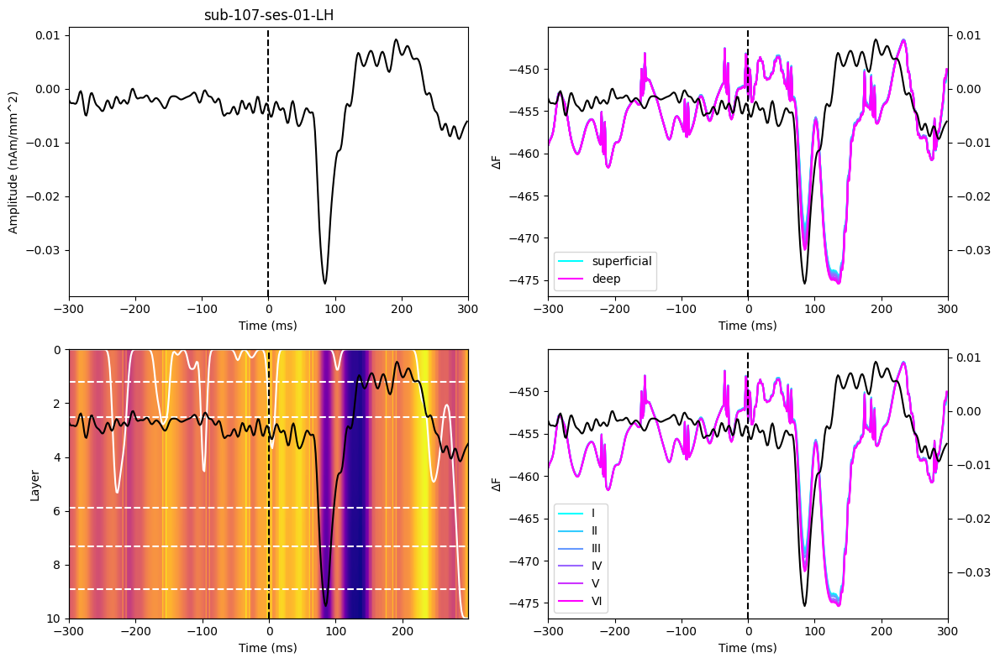

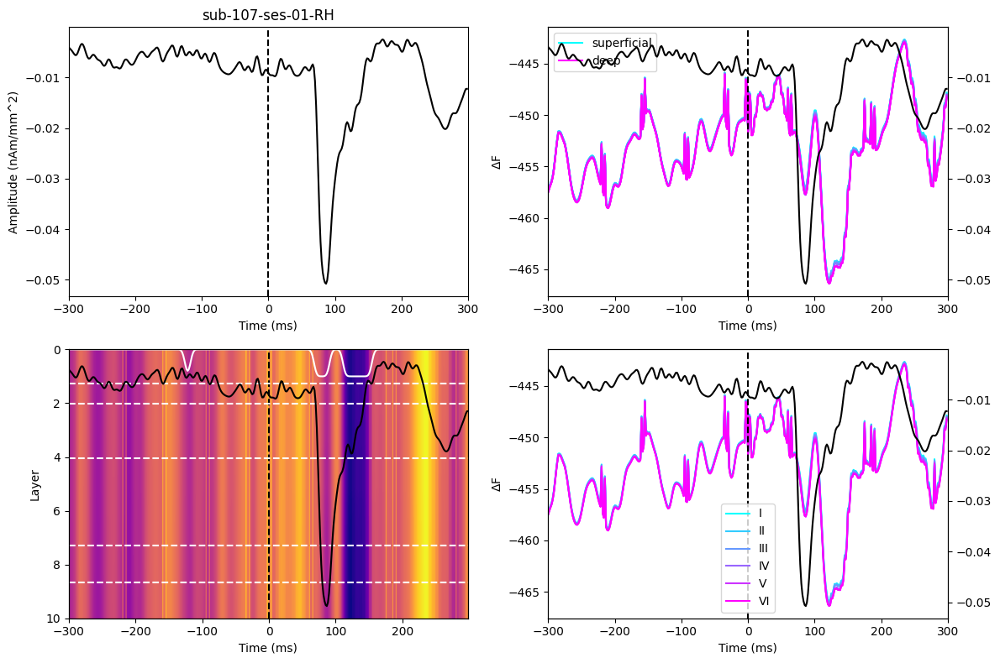

[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5], dtype=int64), array([6, 7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5], dtype=int64), array([6, 7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


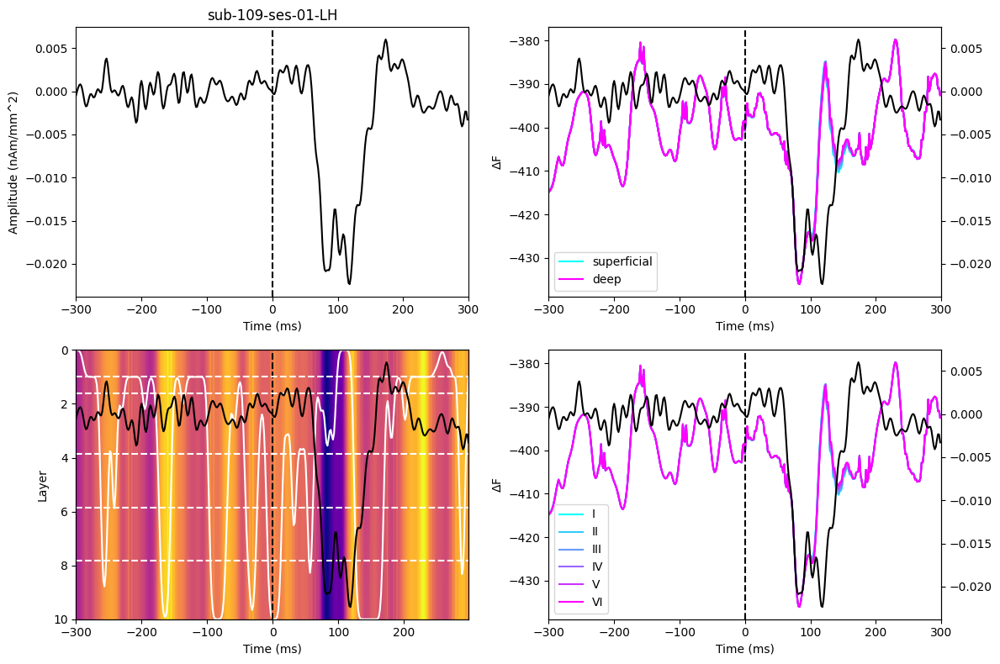

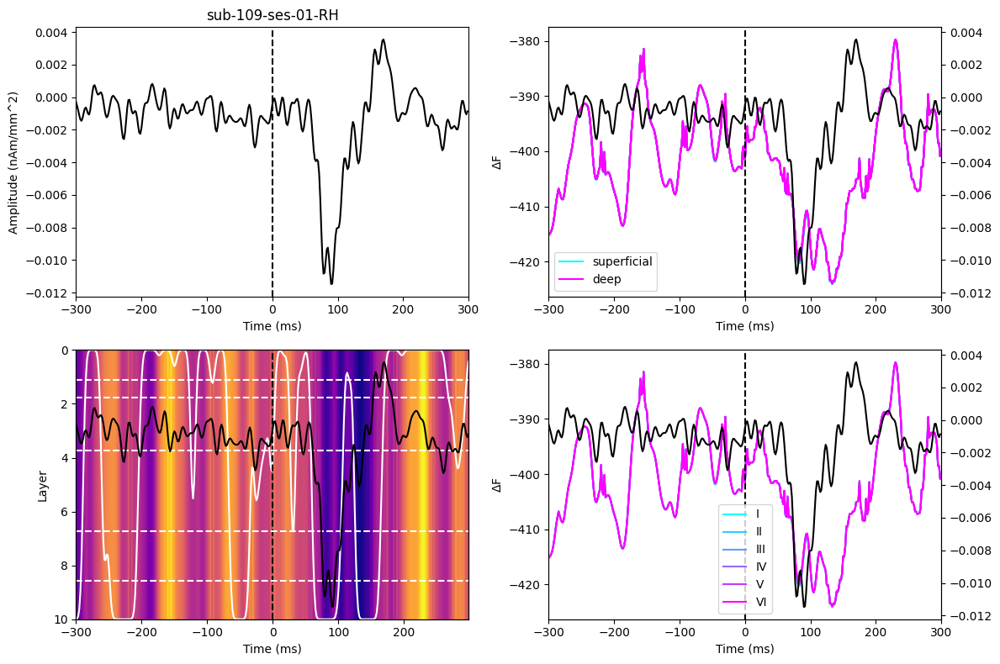

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]


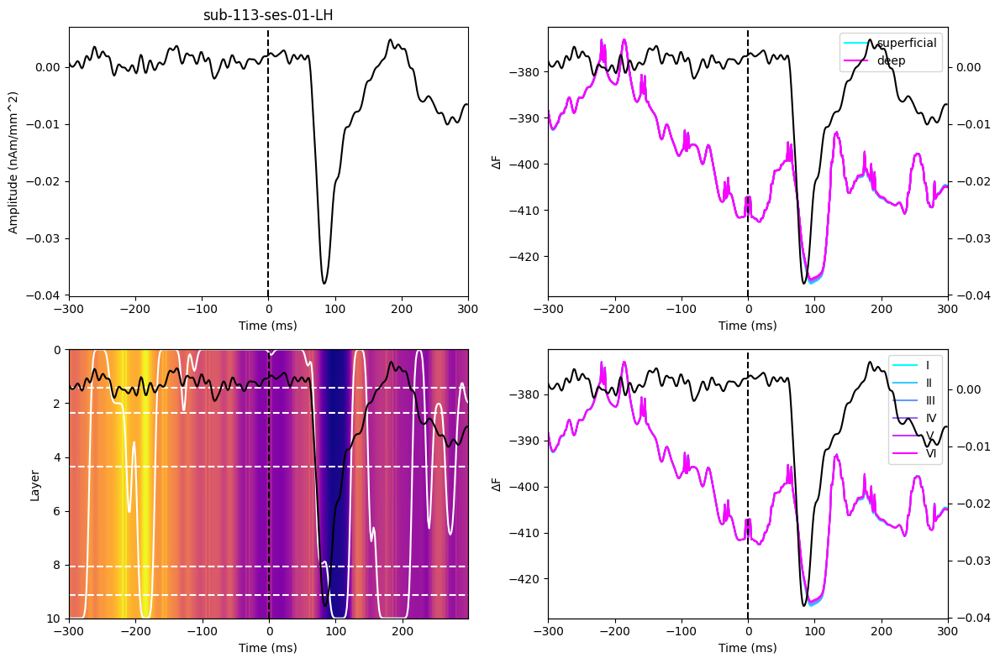

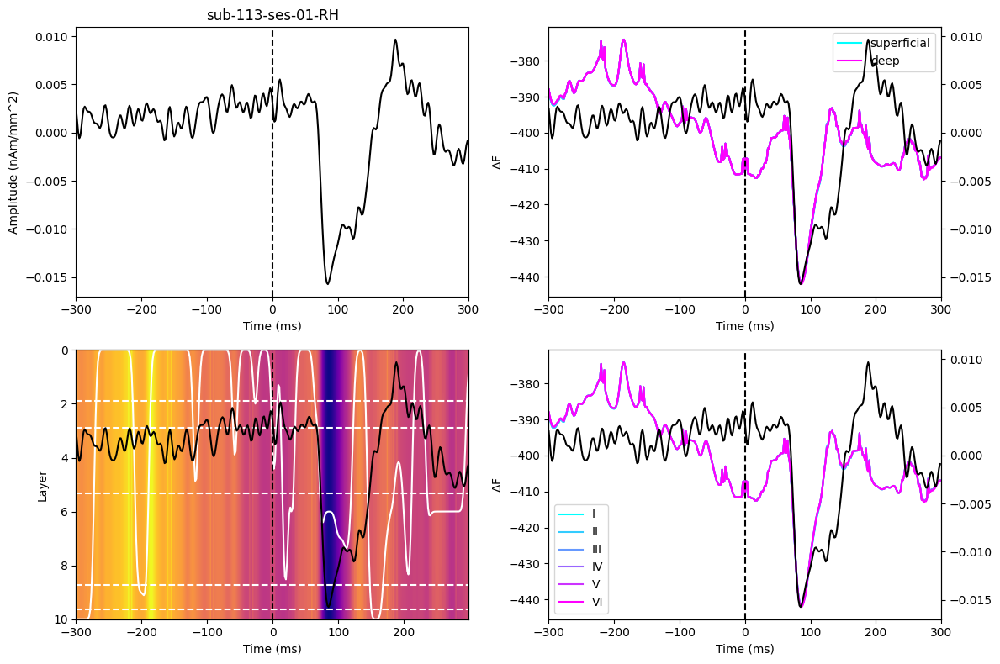

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


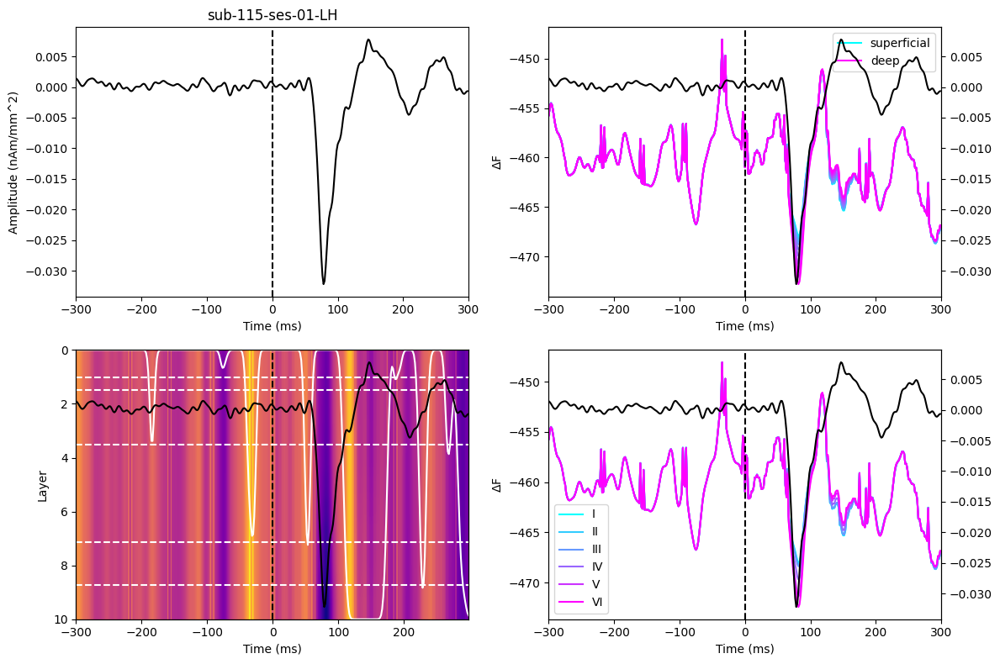

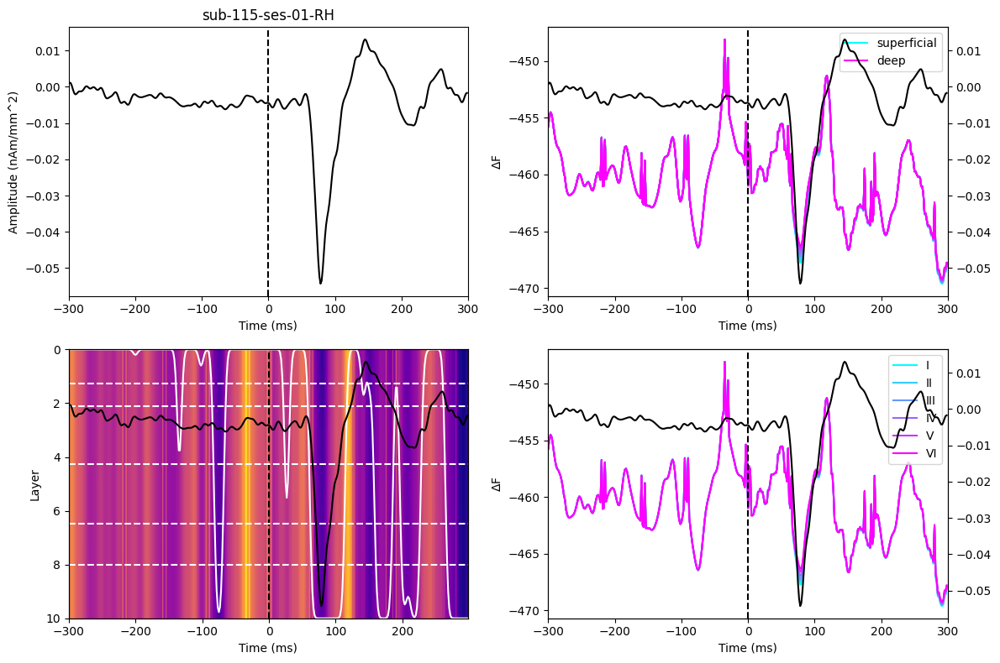

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


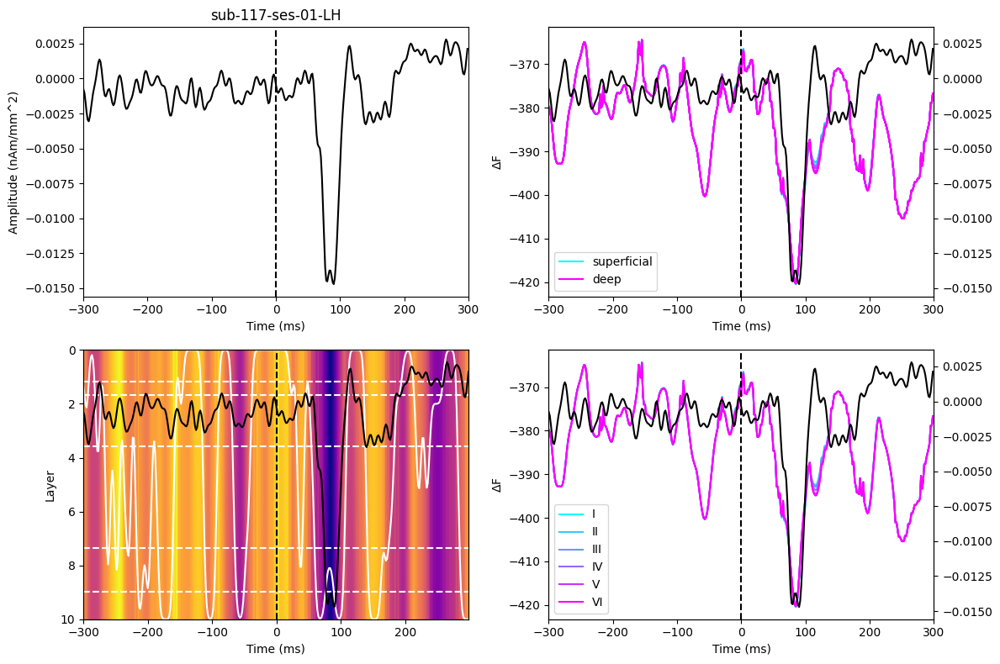

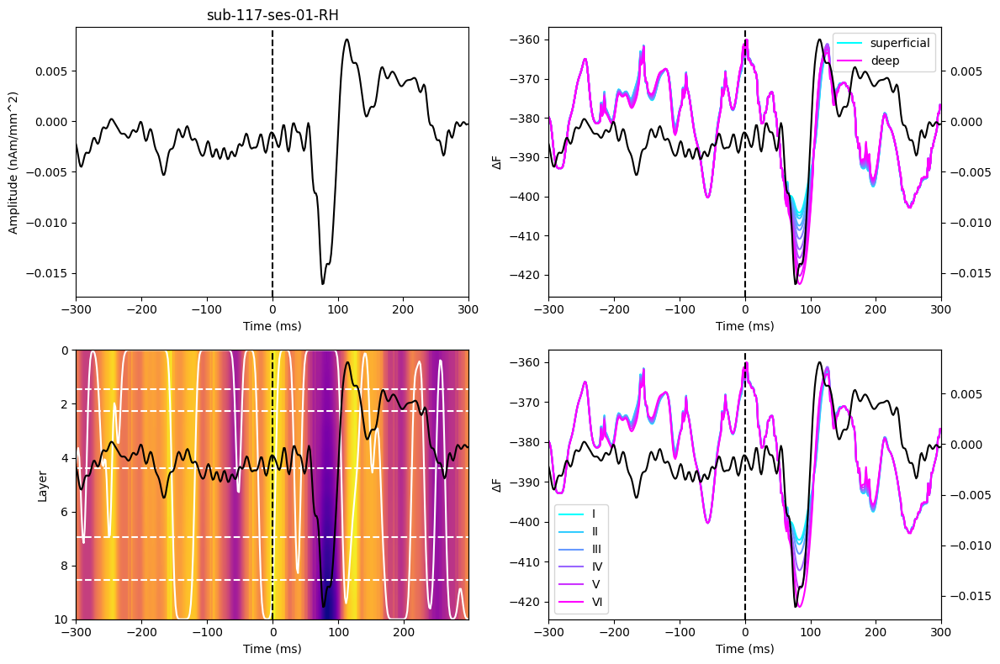

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


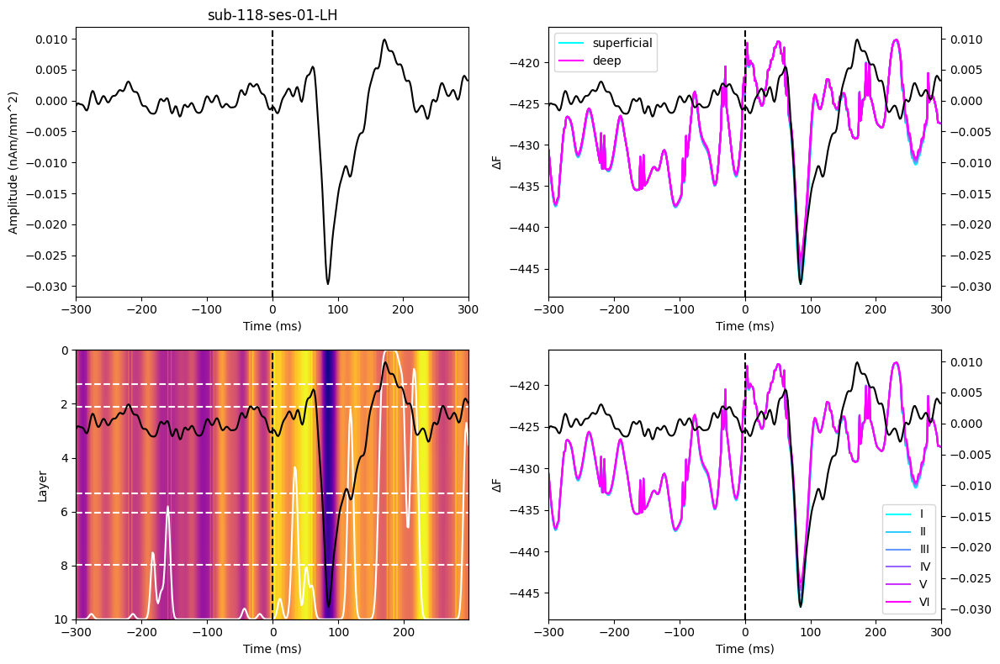

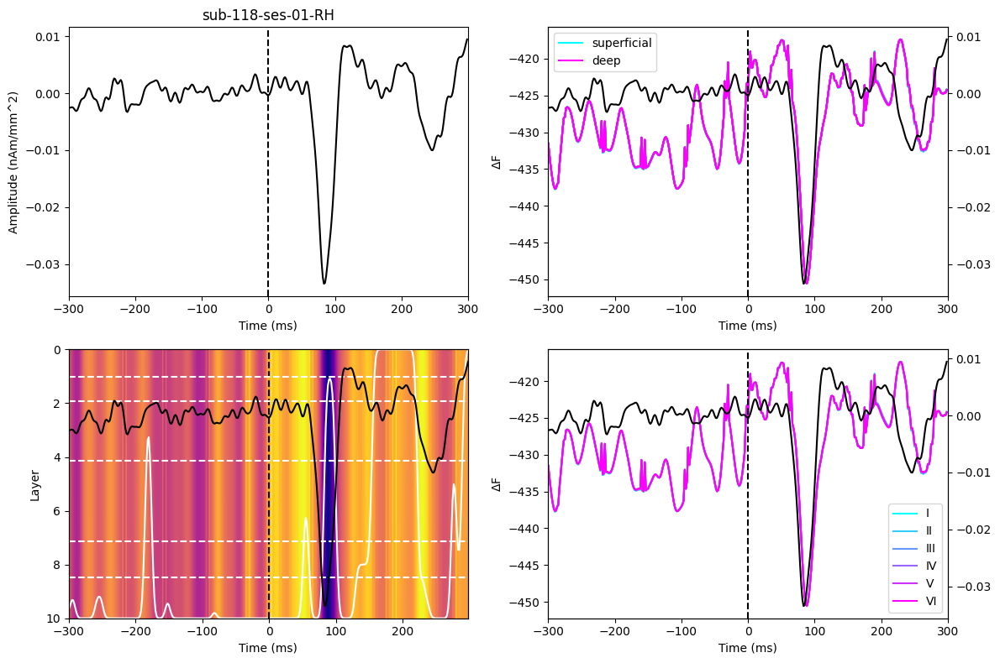

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3, 4], dtype=int64), array([5], dtype=int64), array([6, 7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3, 4], dtype=int64), array([5], dtype=int64), array([6, 7], dtype=int64), array([ 8,  9, 10], dtype=int64)]


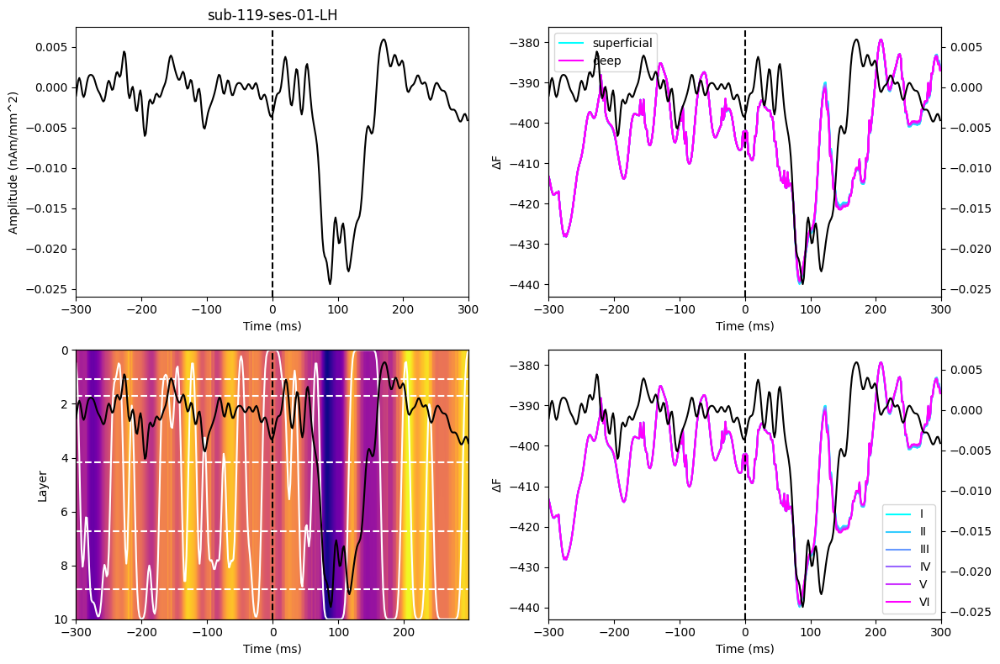

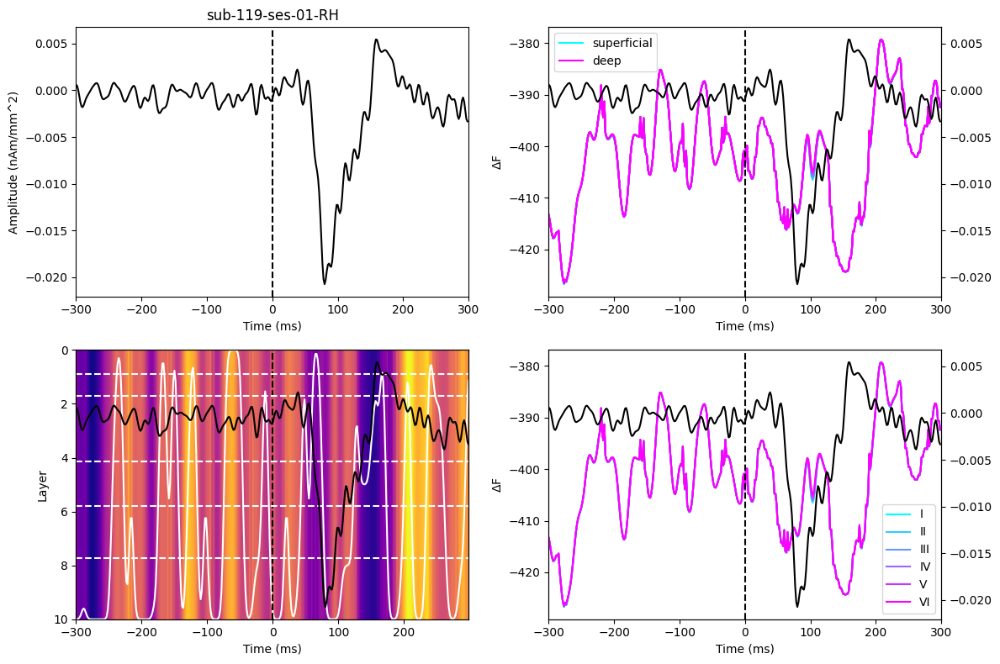

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8, 9], dtype=int64), array([10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8, 9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


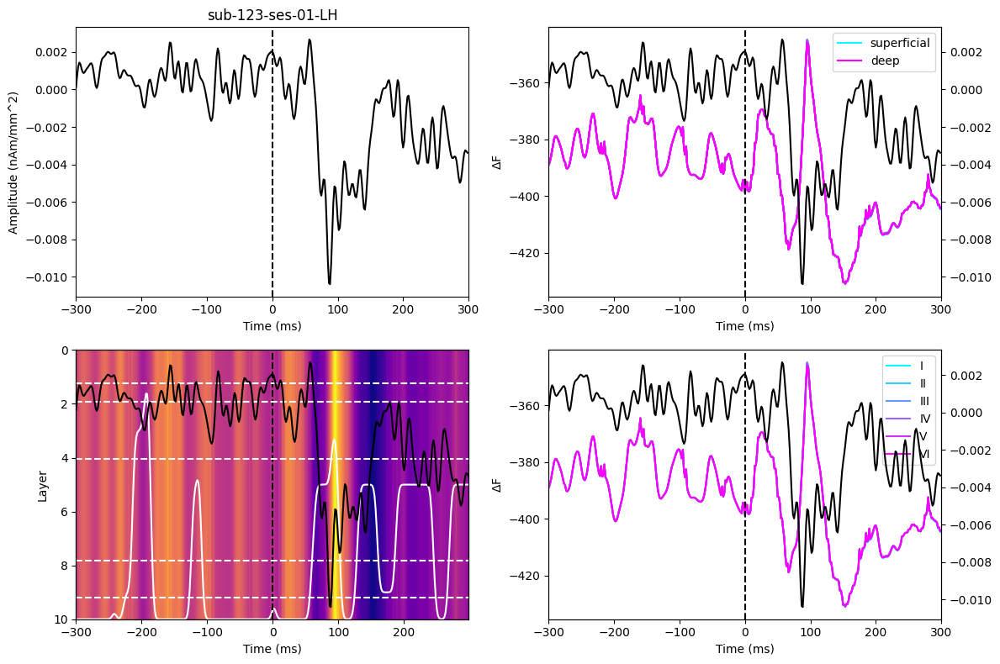

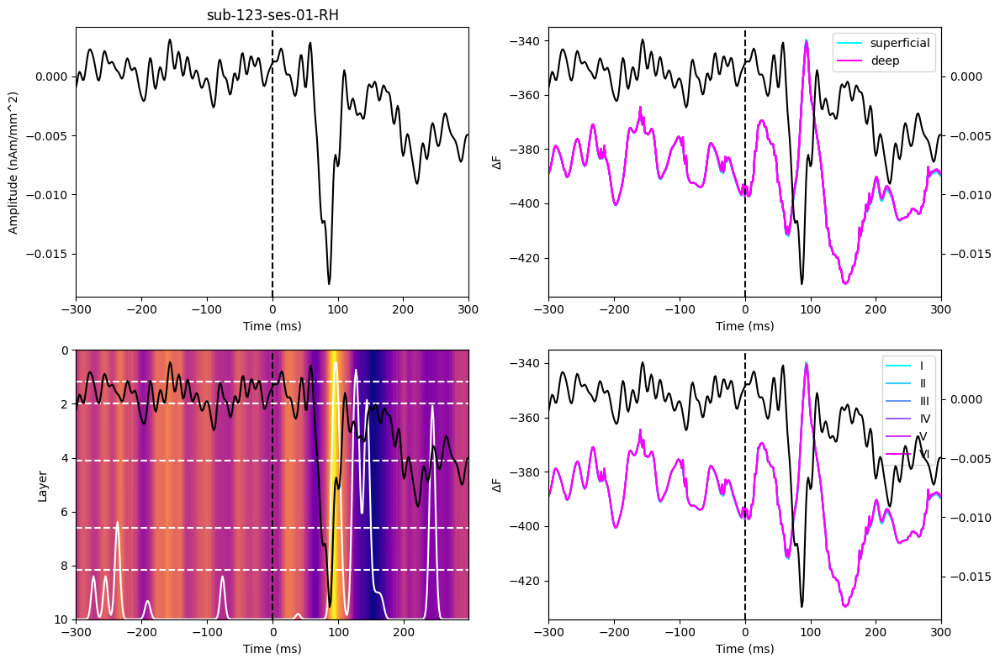

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


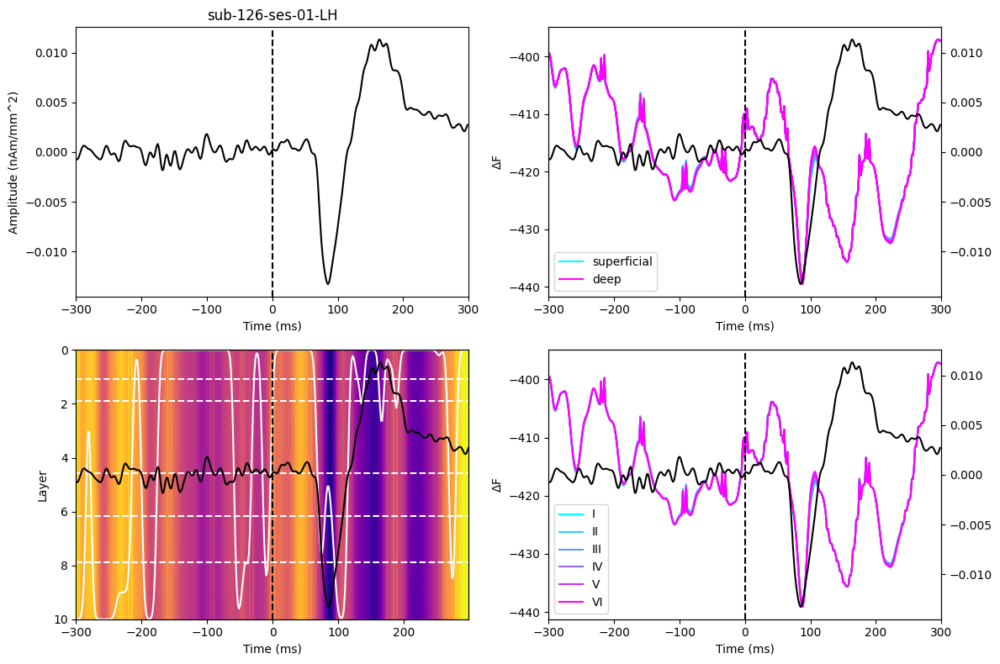

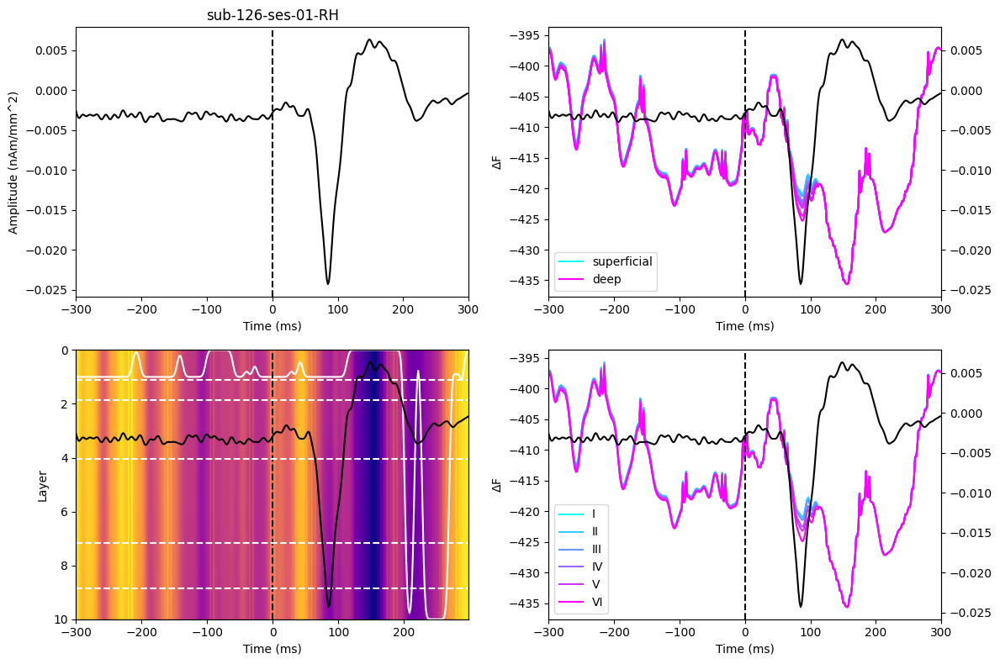

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


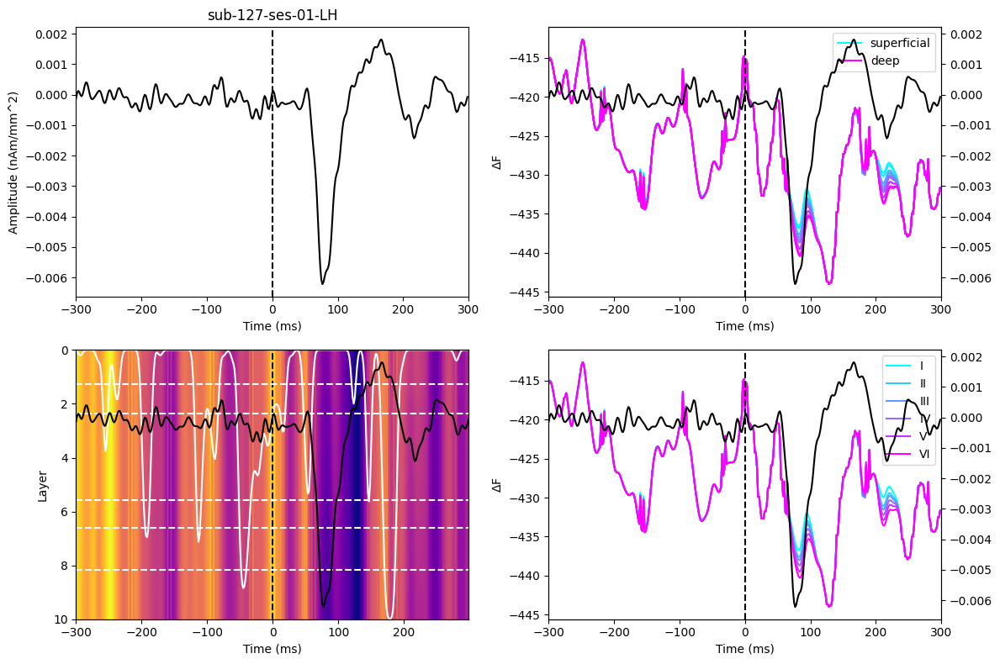

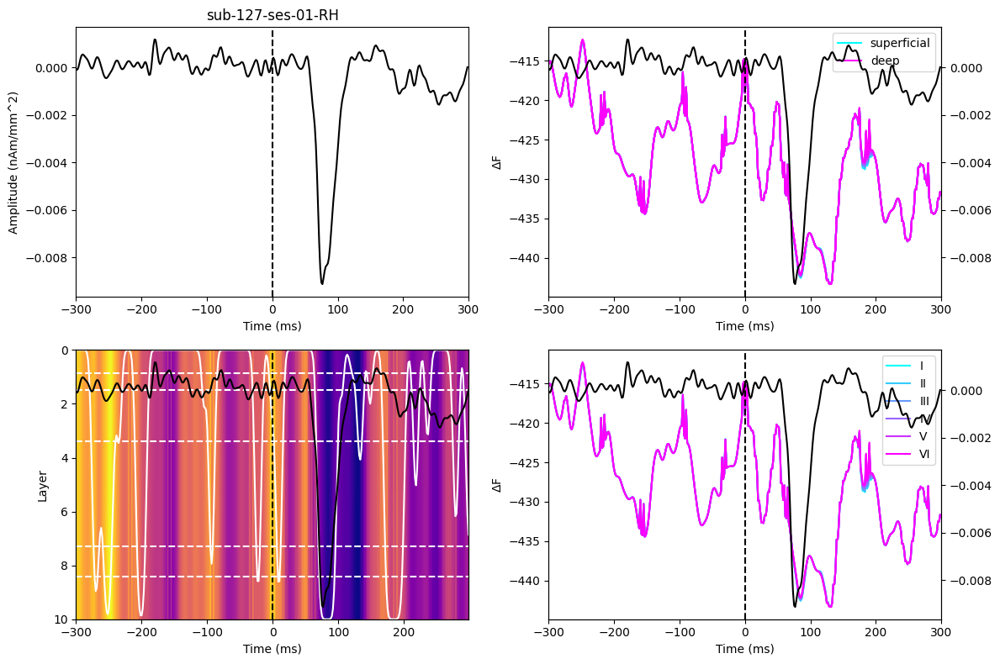

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]


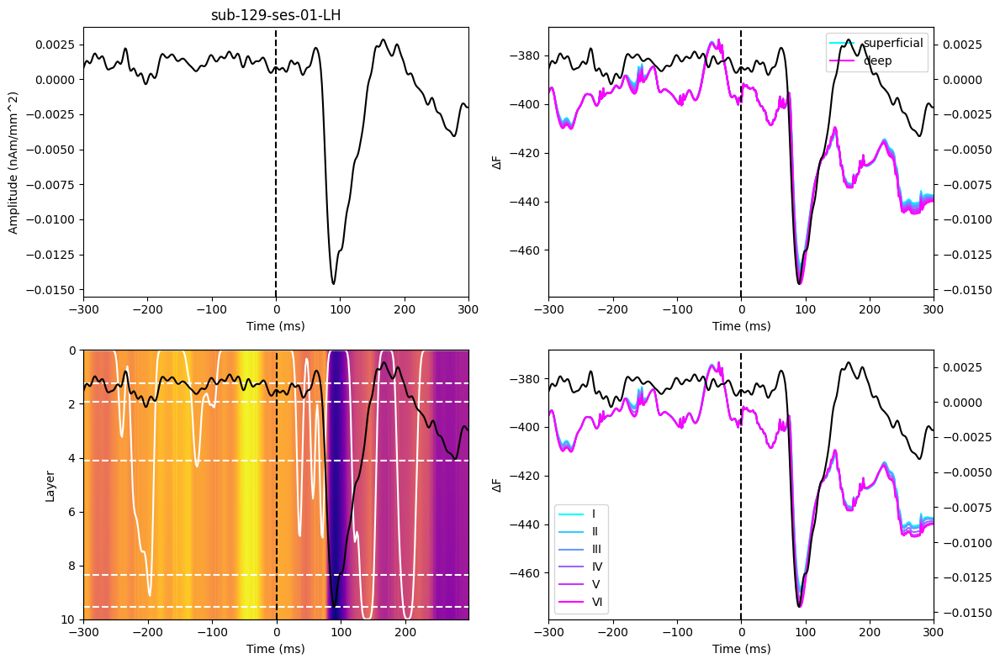

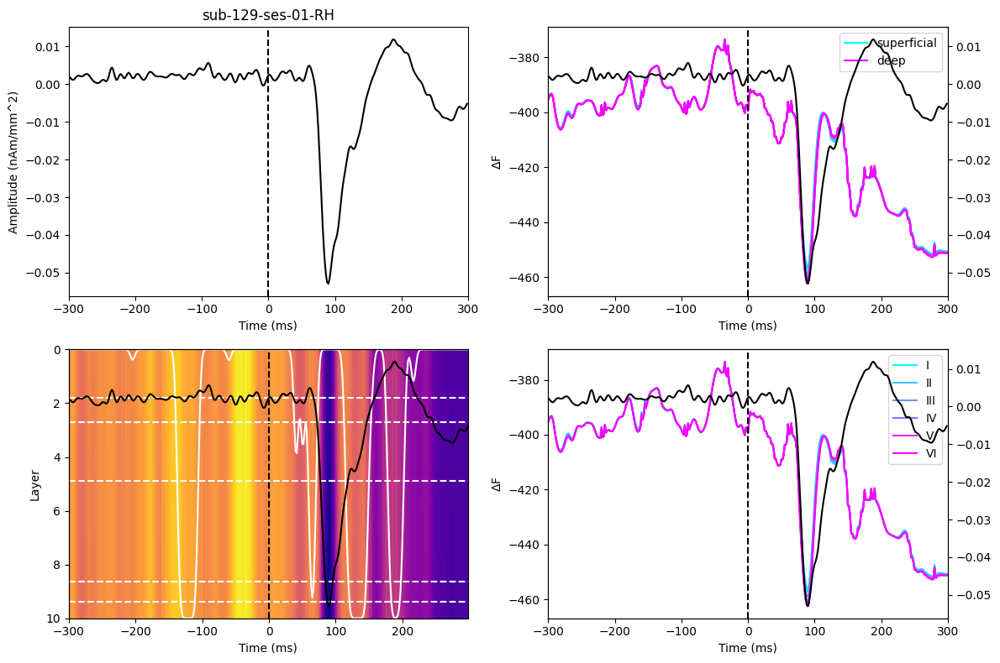

[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


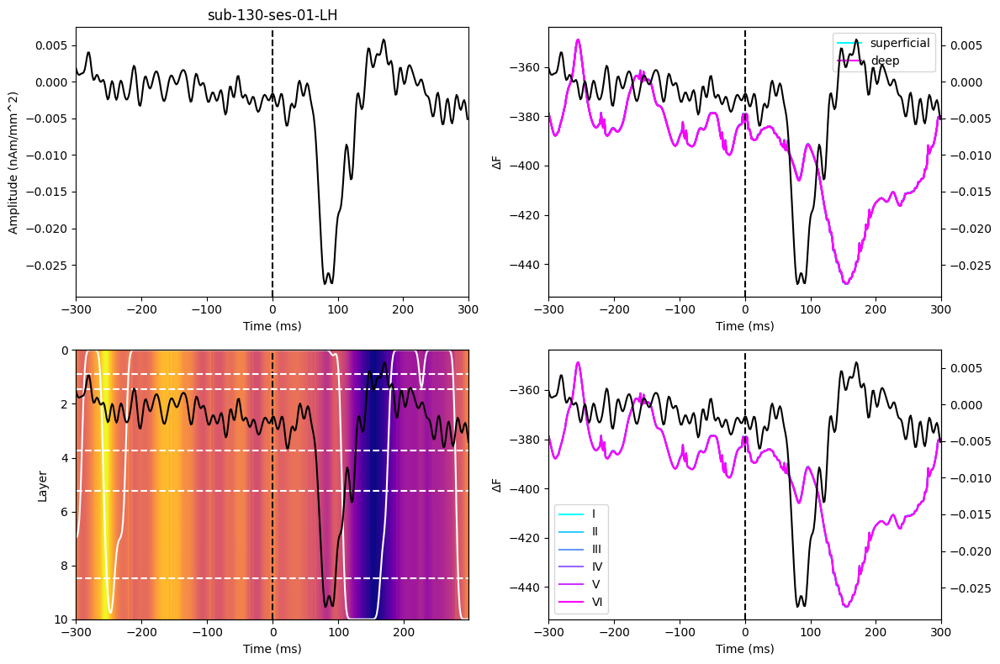

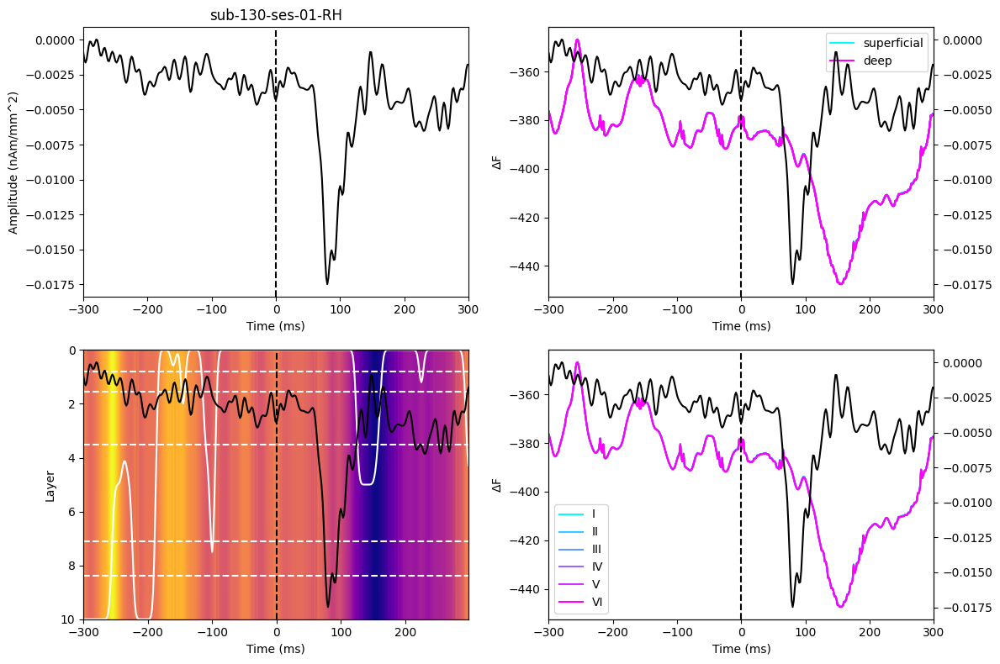

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


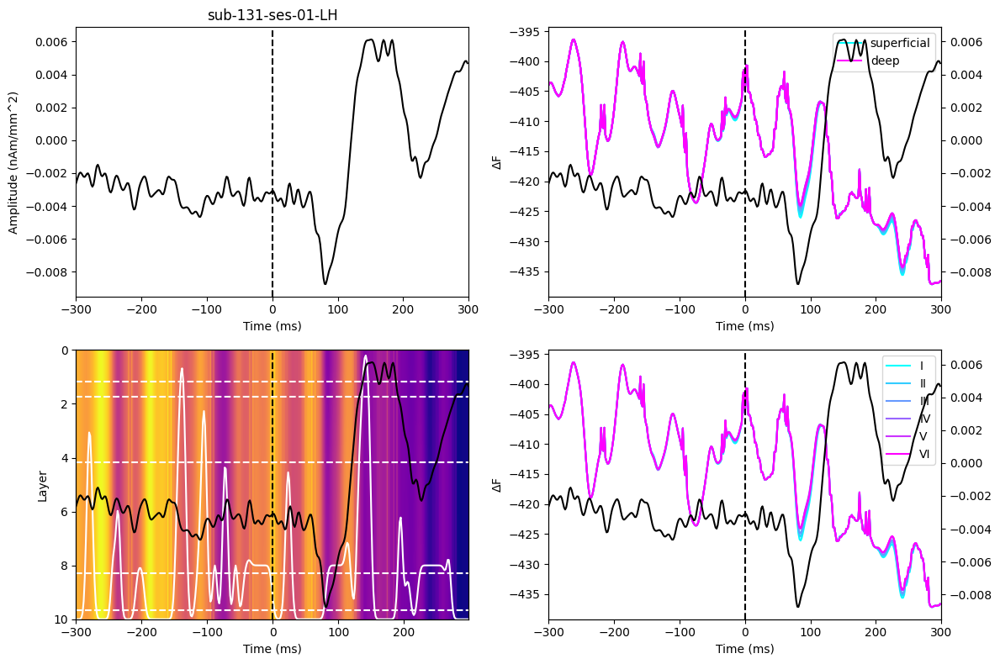

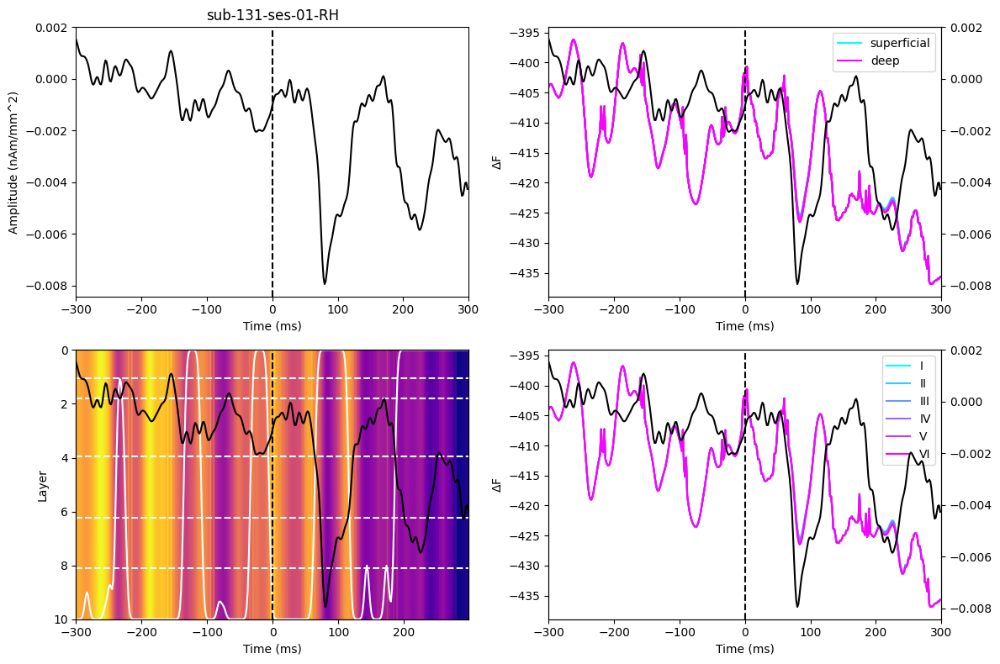

[array([0, 1, 2], dtype=int64), array([3], dtype=int64), array([4, 5, 6, 7, 8], dtype=int64), array([], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
merged
[array([0, 1, 2], dtype=int64), array([3], dtype=int64), array([4, 5, 6, 7, 8], dtype=int64), array([8, 9], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


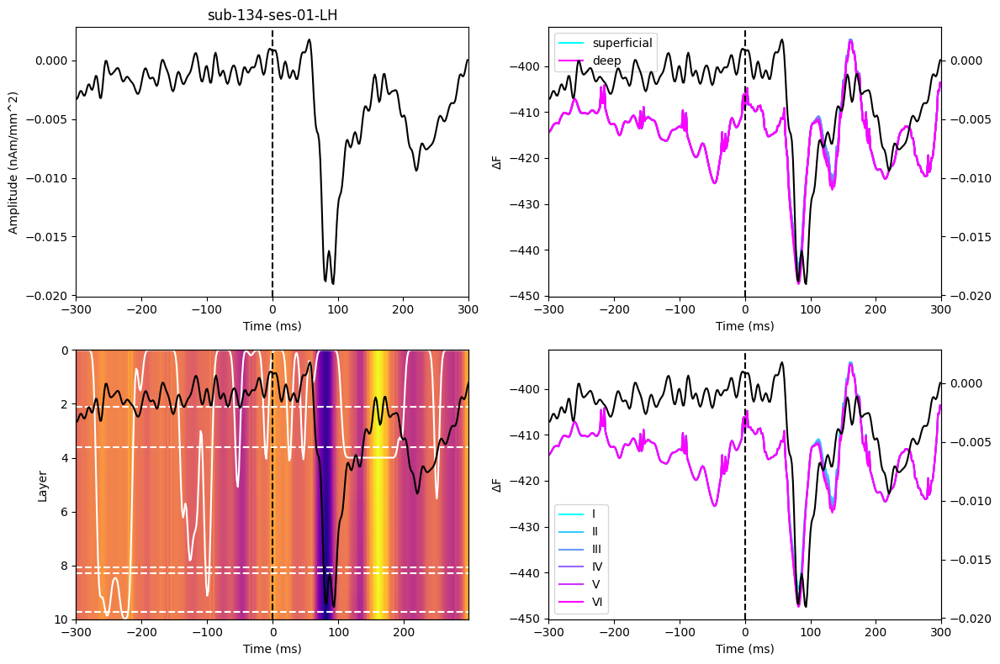

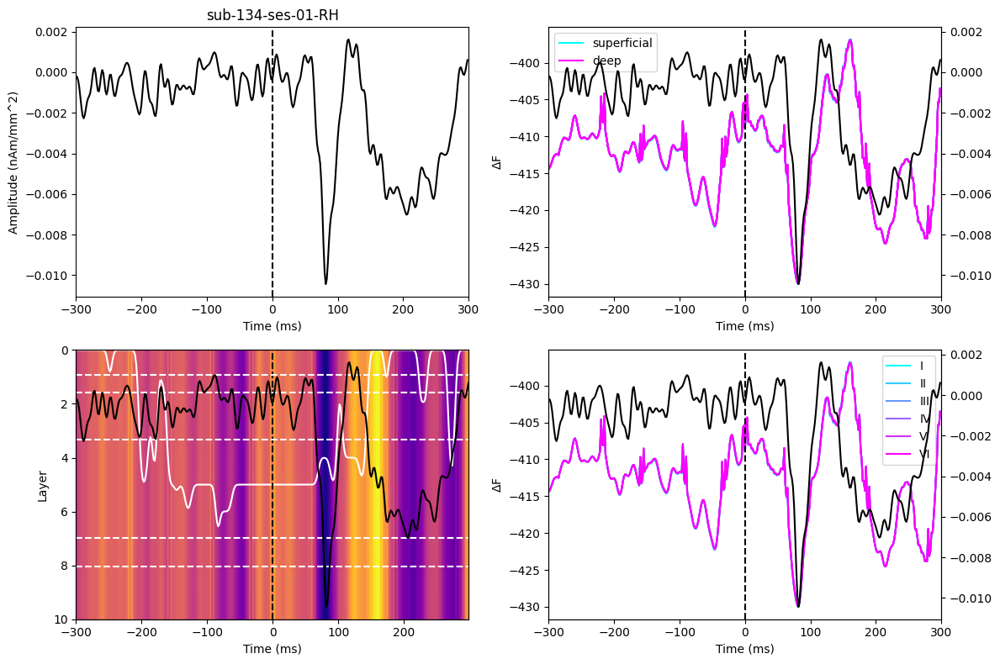

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5, 6], dtype=int64), array([7], dtype=int64), array([8, 9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5, 6], dtype=int64), array([7], dtype=int64), array([8, 9], dtype=int64), array([10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


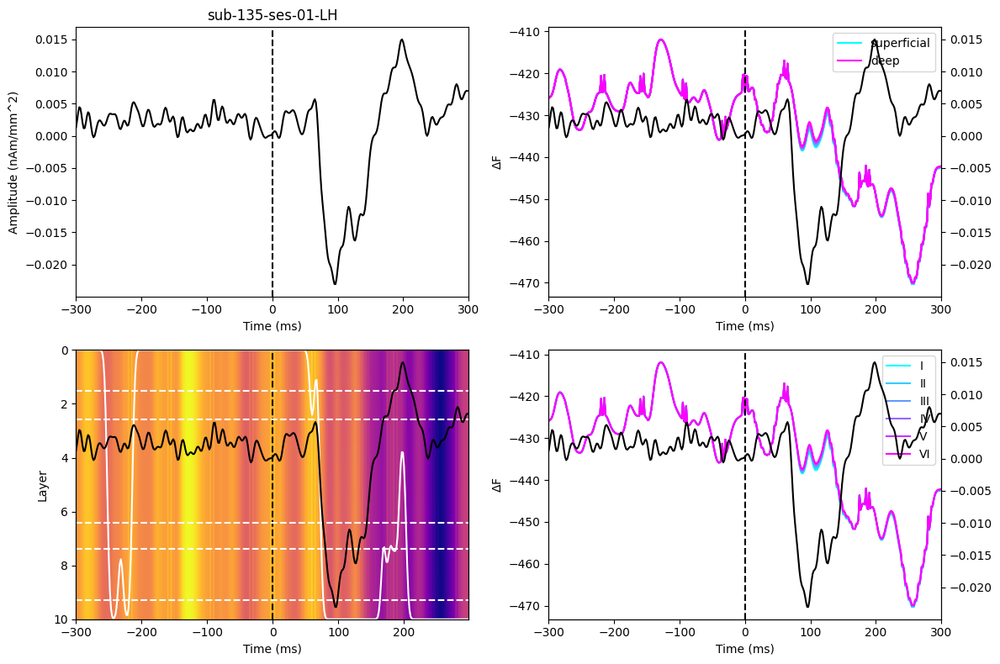

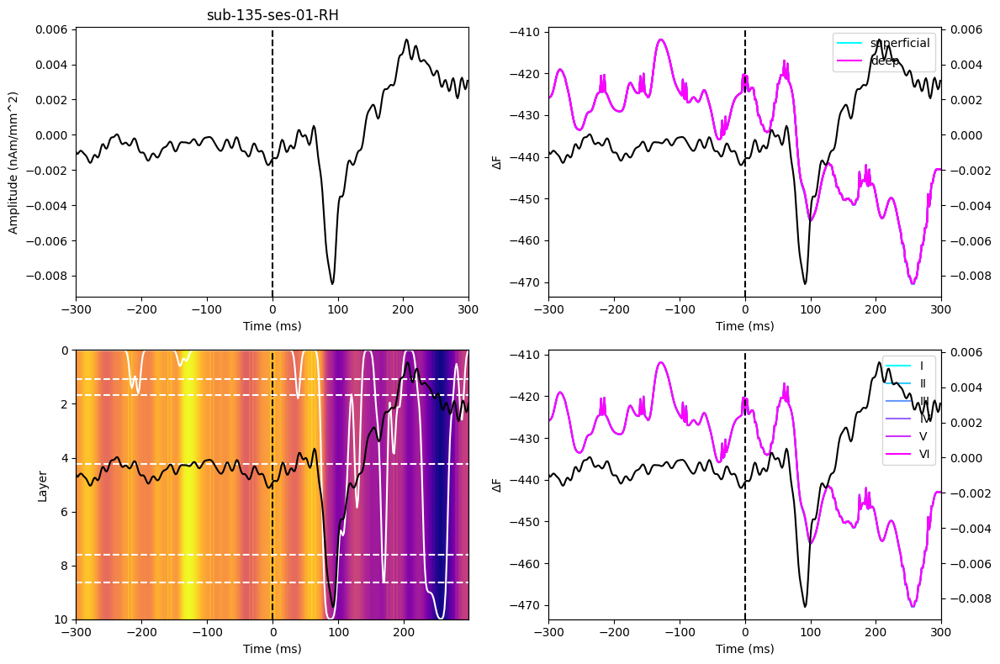

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7], dtype=int64), array([ 8,  9, 10], dtype=int64)]


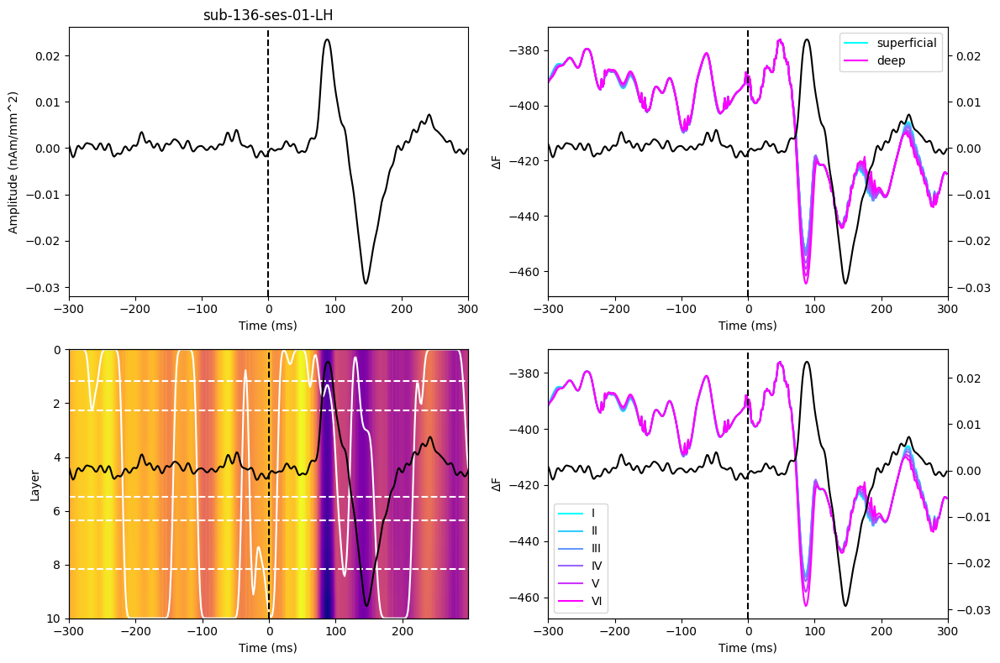

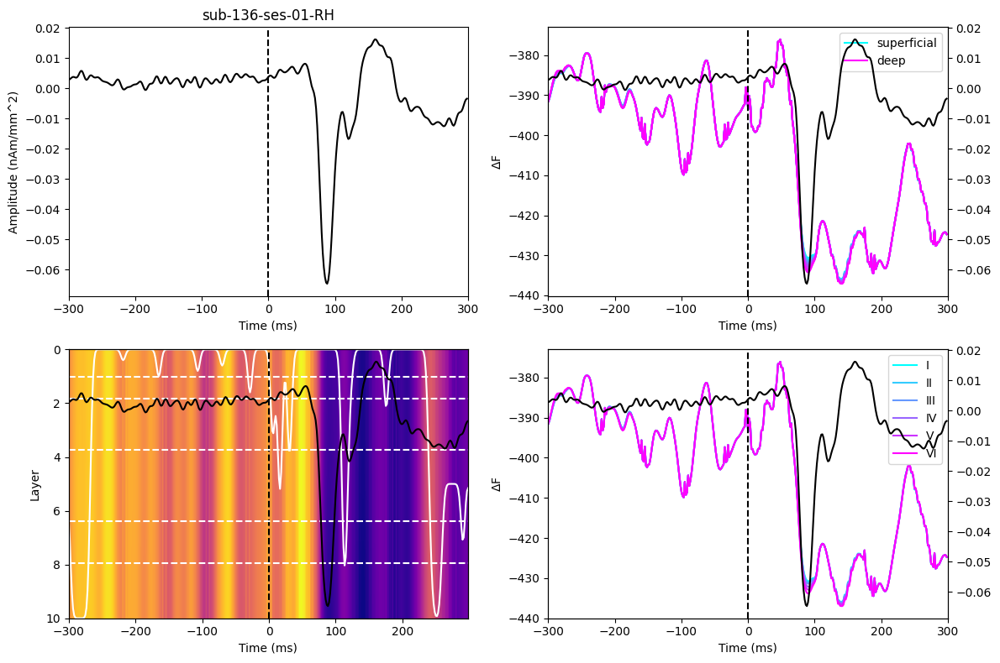

[array([0, 1, 2], dtype=int64), array([3], dtype=int64), array([4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0, 1, 2], dtype=int64), array([3], dtype=int64), array([4, 5], dtype=int64), array([6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]


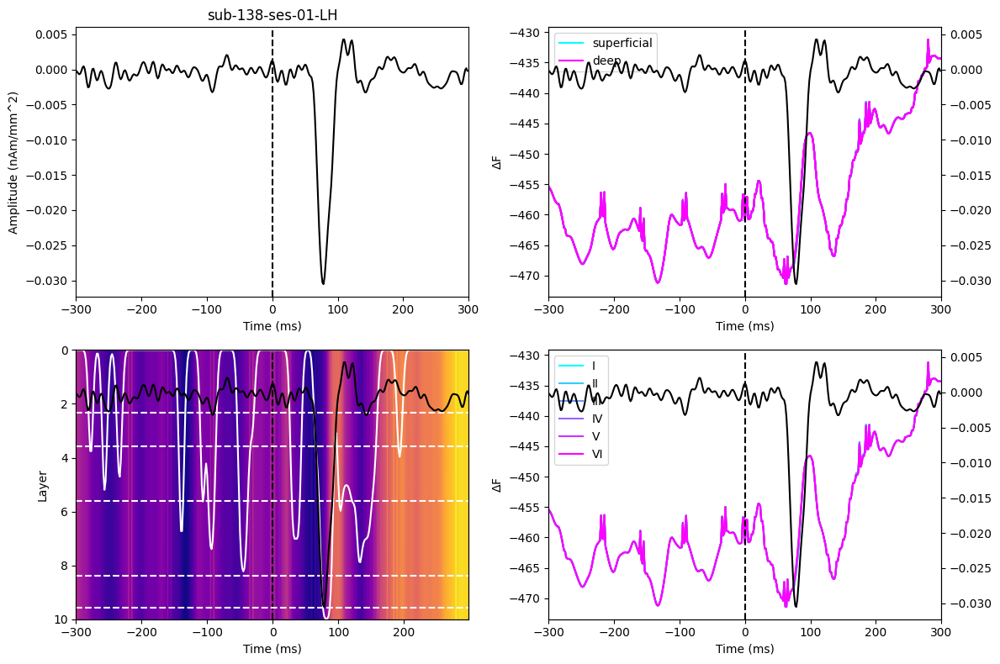

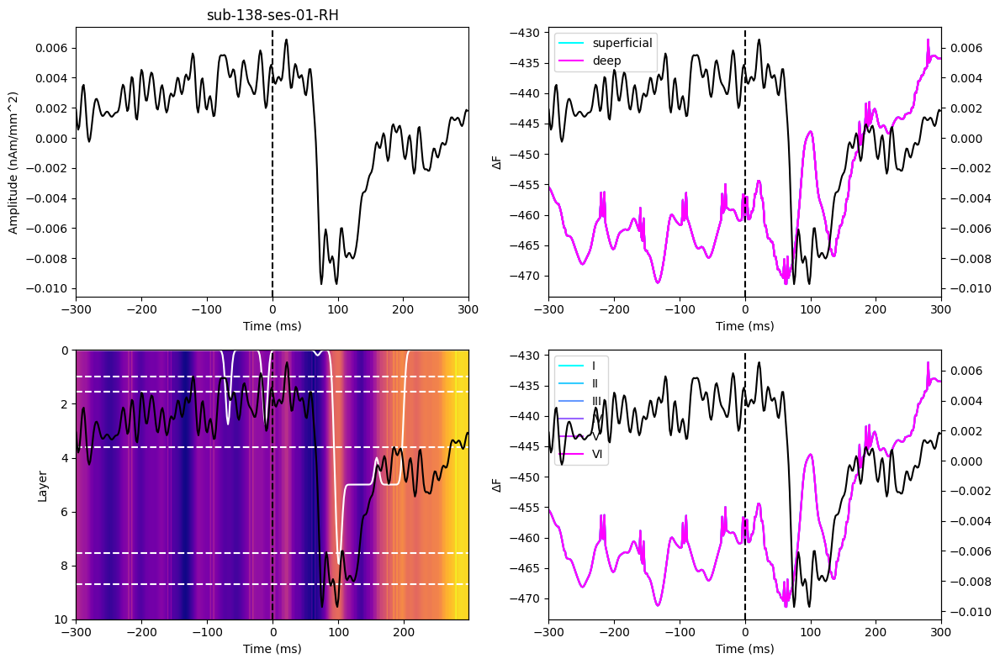

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6, 7], dtype=int64), array([8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


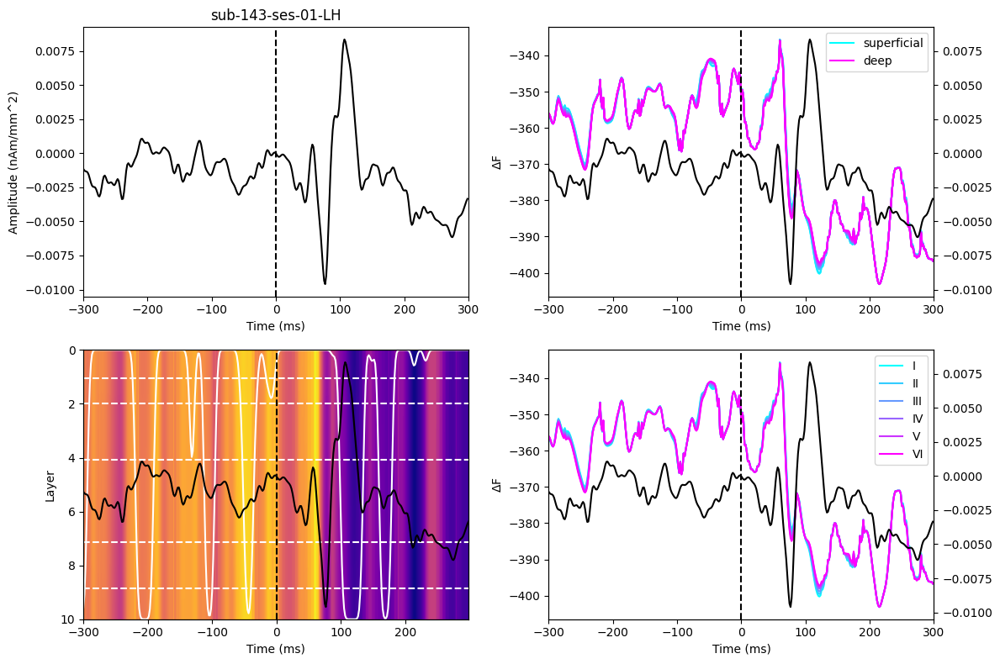

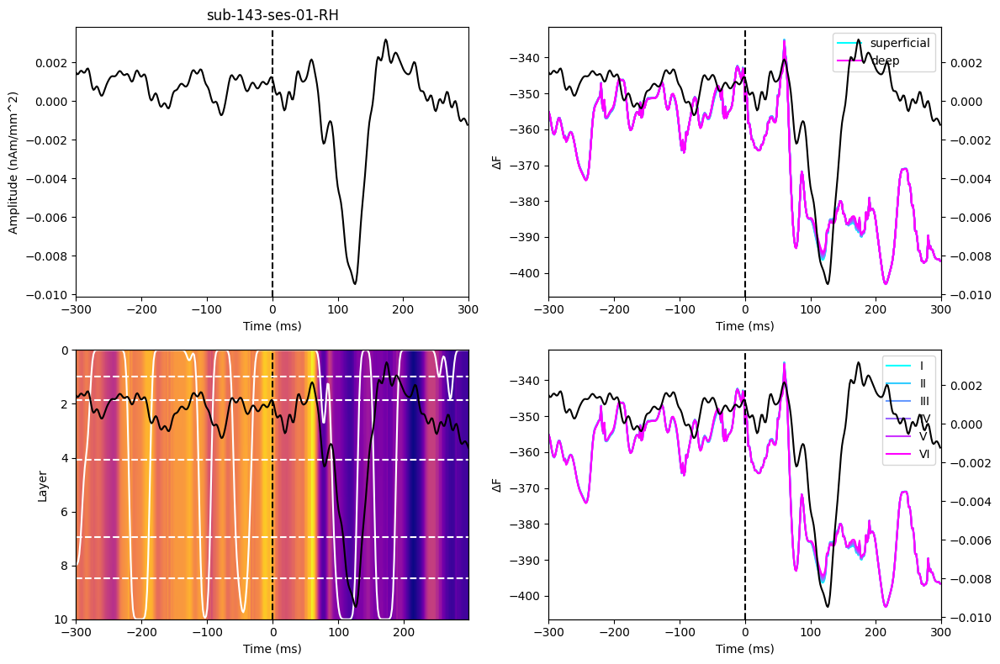

[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0], dtype=int64), array([1], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]


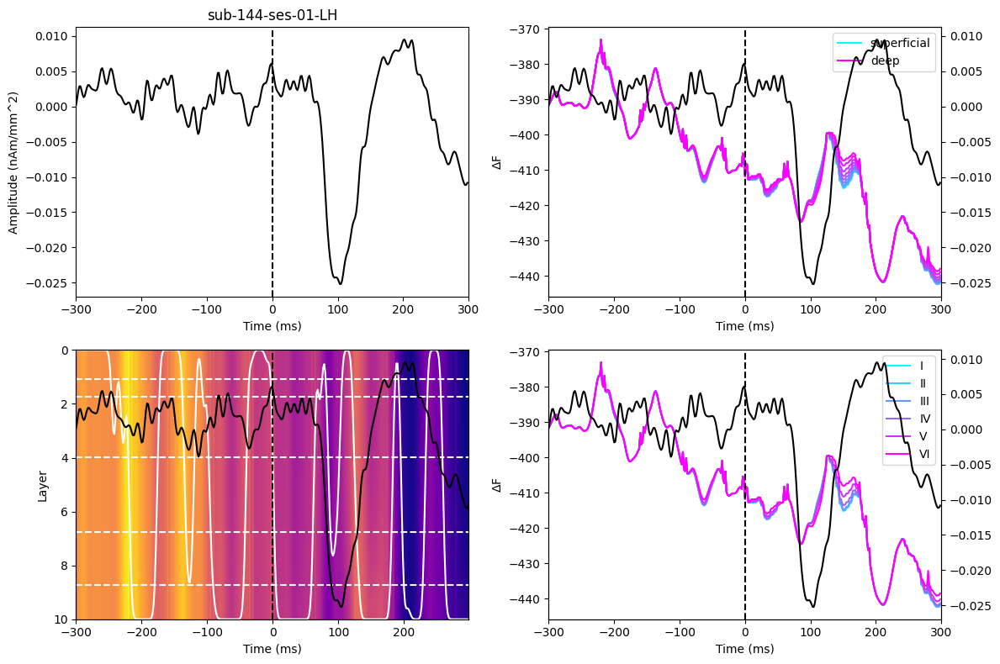

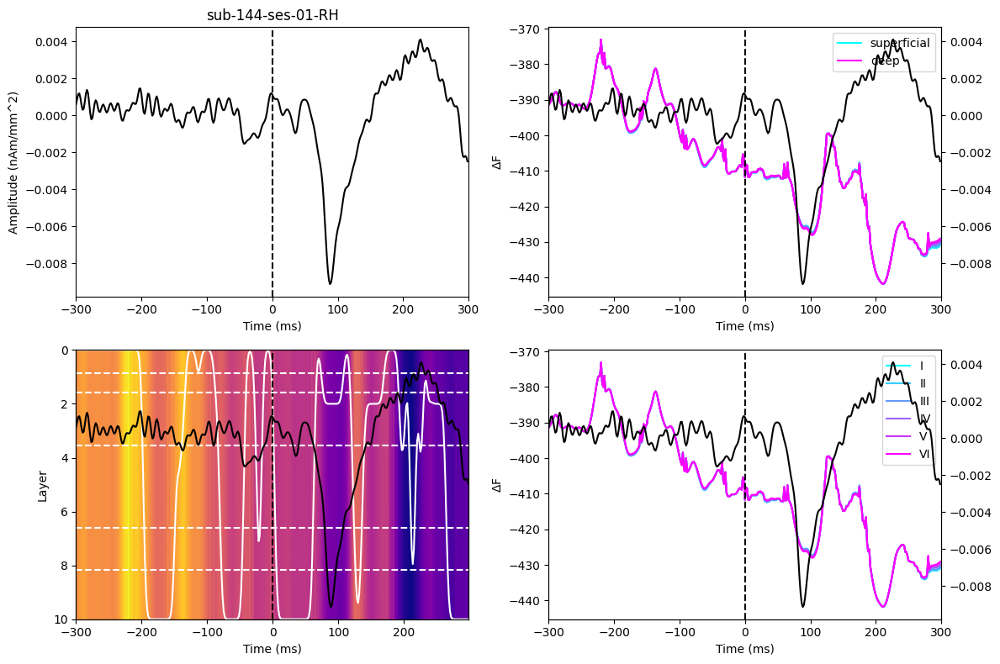

[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([2], dtype=int64), array([3, 4, 5], dtype=int64), array([6], dtype=int64), array([7, 8], dtype=int64), array([ 9, 10], dtype=int64)]
[array([0, 1], dtype=int64), array([], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]
merged
[array([0, 1], dtype=int64), array([1, 2], dtype=int64), array([2, 3], dtype=int64), array([4, 5, 6, 7, 8], dtype=int64), array([9], dtype=int64), array([10], dtype=int64)]


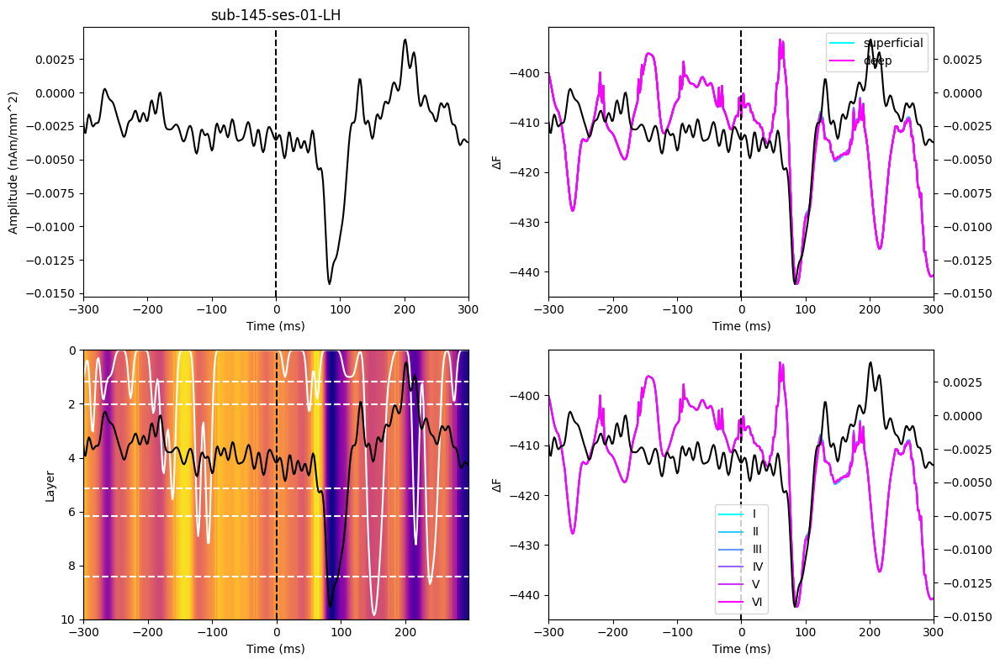

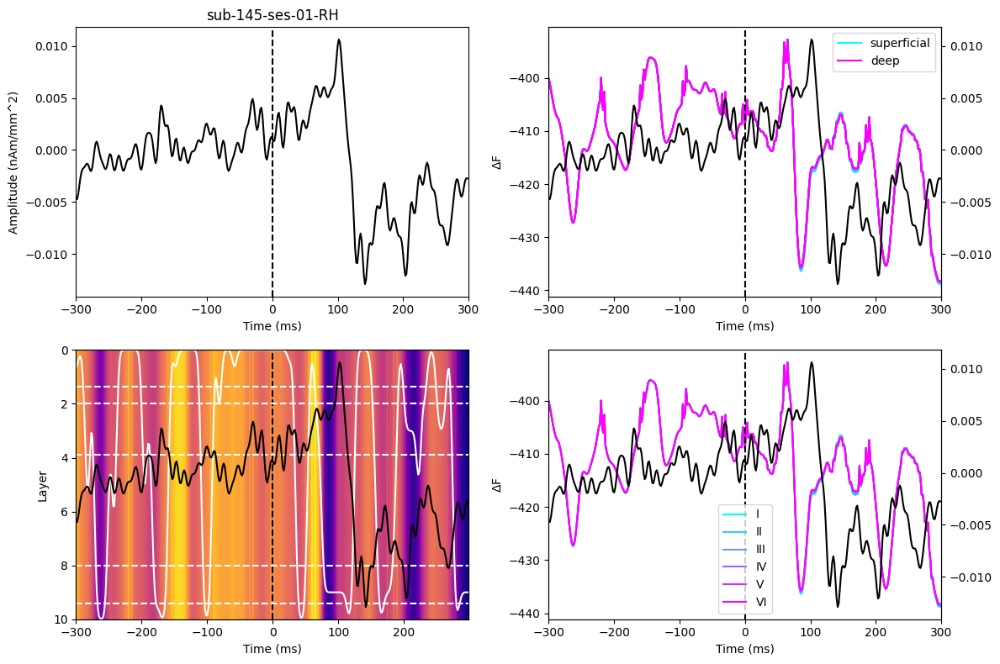

In [ ]:
from scipy.special import logsumexp
import numpy as np


subjects=['sub-105', 'sub-107', 'sub-109', 'sub-113', 'sub-114',
           'sub-115', 'sub-117','sub-118','sub-119', 'sub-123', 
           'sub-124', 'sub-126','sub-127','sub-129', 'sub-130',
           'sub-131','sub-132','sub-133','sub-134','sub-135', 
           'sub-136', 'sub-137','sub-138', 'sub-141','sub-142',
           'sub-143','sub-144','sub-145']

sessions = {
    'sub-105': ['ses-01'], 'sub-107': ['ses-01'], 'sub-109': ['ses-01'], 'sub-113': ['ses-01'], 
    'sub-114': ['ses-01'], 'sub-115': ['ses-01'],'sub-117': ['ses-01'], 'sub-118': ['ses-01'], 
    'sub-119': ['ses-01'], 'sub-123': ['ses-01'],'sub-124': ['ses-01'], 'sub-126': ['ses-01'], 
    'sub-127': ['ses-01'], 'sub-129': ['ses-01'],'sub-130': ['ses-01'], 'sub-131': ['ses-01'],
    'sub-132': ['ses-01'], 'sub-133': ['ses-01'],'sub-134': ['ses-01'], 'sub-135': ['ses-01'], 
    'sub-136': ['ses-01'], 'sub-137': ['ses-01'], 'sub-138': ['ses-01'],'sub-141': ['ses-01'], 
    'sub-142': ['ses-01'], 'sub-143': ['ses-01'], 'sub-144': ['ses-01'],
    'sub-145': ['ses-01']
}


n_layers=11
time_lims=[-300,300]
# time_lims=[0,150] 
out_dir=os.path.join('')
braindyn_files = ""

all_lh_prior_ts=[]
all_lh_F_diff=[]
all_lh_layer_F_diff=[]
all_lh_bb_boundaries=[]

all_rh_prior_ts=[]
all_rh_F_diff=[]
all_rh_layer_F_diff=[]
all_rh_bb_boundaries=[]

for subject in subjects:
    sub_n=subject.split('-')[-1]
    for sess_idx, session in enumerate(sessions[subject]):
        out_fname = os.path.join(out_dir,f'results_{subject}_{session}_left_stim.npz')
        if os.path.exists(out_fname):
            subj_surf_dir=os.path.join(braindyn_files,f'{sub_n}-synth','layer_surf')
            orig_inflated=nib.load(os.path.join(subj_surf_dir, 'inflated.gii'))
            ds_inflated=nib.load(os.path.join(subj_surf_dir, 'inflated.ds.gii'))
            ds_pial = nib.load(os.path.join(subj_surf_dir, 'pial.ds.gii'))

            data = np.load(out_fname, allow_pickle=True)
            lh_prior = data['lh_prior']
            lh_prior_ts = data['lh_prior_ts']
            rh_prior = data['rh_prior']
            rh_prior_ts = data['rh_prior_ts']
            ts_time = data['ts_time']
            lh_Fs = data['lh_Fs']
            rh_Fs = data['rh_Fs']
            wois = data['wois']

            woi_time=np.mean(wois,axis=-1)
            t_idx=np.where((woi_time>=time_lims[0]) & (woi_time<=time_lims[1]))[0]
            woi_win=woi_time[t_idx]
            lh_Fs_win=lh_Fs[:,t_idx]
            rh_Fs_win=rh_Fs[:,t_idx]

            ts_idx=np.where((ts_time>=time_lims[0]) & (ts_time<=time_lims[1]))[0]
            lh_prior_ts=lh_prior_ts[ts_idx]
            rh_prior_ts=rh_prior_ts[ts_idx]
            ts_time=ts_time[ts_idx]
            
            m_idx=np.argmax(np.abs(lh_prior_ts))
            if lh_prior_ts[m_idx]>0:
                lh_prior_ts=-1*lh_prior_ts
            m_idx=np.argmax(np.abs(rh_prior_ts))
            if rh_prior_ts[m_idx]>0:
                rh_prior_ts=-1*rh_prior_ts

            # Compute the relative free energy for each layer model, compared to the worst model at each time step
            lh_F_diff = lh_Fs_win.copy()
            rh_F_diff = rh_Fs_win.copy()

                
            lh_surf_bb_bounds=n_layers*get_bigbrain_layer_boundaries(f'{sub_n}-synth', subj_surf_dir, subj_coord=ds_pial.darrays[0].data[lh_prior,:])

            lh_idx = split_into_6_layers(n_layers, lh_surf_bb_bounds)
            
            lh_layer_F = np.vstack([ np.mean(lh_Fs_win[rh_idx[0], :], axis=0), 
                np.mean(lh_Fs_win[lh_idx[1], :], axis=0), 
                np.mean(lh_Fs_win[lh_idx[2], :], axis=0), 
                np.mean(lh_Fs_win[lh_idx[3], :], axis=0), 
                np.mean(lh_Fs_win[lh_idx[4], :], axis=0), 
                np.mean(lh_Fs_win[lh_idx[5], :], axis=0), 
            ])
            
            #lh_layer_F = np.vstack([
            #    logsumexp(lh_Fs_win[lh_idx[0], :], axis=0) - np.log(len(lh_idx[0])),
            #    logsumexp(lh_Fs_win[lh_idx[1], :], axis=0) - np.log(len(lh_idx[1])),
            #    logsumexp(lh_Fs_win[lh_idx[2], :], axis=0) - np.log(len(lh_idx[2])),
            #    logsumexp(lh_Fs_win[lh_idx[3], :], axis=0) - np.log(len(lh_idx[3])),
            #    logsumexp(lh_Fs_win[lh_idx[4], :], axis=0) - np.log(len(lh_idx[4])),
            #    logsumexp(lh_Fs_win[lh_idx[5], :], axis=0) - np.log(len(lh_idx[5])),
            #])


            lh_layer_F_diff = lh_layer_F.copy()
                
            rh_surf_bb_bounds=n_layers*get_bigbrain_layer_boundaries(f'{sub_n}-synth', subj_surf_dir, subj_coord=ds_pial.darrays[0].data[rh_prior,:])
            
            rh_idx = split_into_6_layers(n_layers, rh_surf_bb_bounds)
            
            rh_layer_F = np.vstack([ np.mean(rh_Fs_win[rh_idx[0], :], axis=0), 
                np.mean(rh_Fs_win[rh_idx[1], :], axis=0), 
                np.mean(rh_Fs_win[rh_idx[2], :], axis=0), 
                np.mean(rh_Fs_win[rh_idx[3], :], axis=0), 
                np.mean(rh_Fs_win[rh_idx[4], :], axis=0), 
                np.mean(rh_Fs_win[rh_idx[5], :], axis=0), 
            ])
            
            #rh_layer_F = np.vstack([
            #    logsumexp(rh_Fs_win[rh_idx[0], :], axis=0) - np.log(len(rh_idx[0])),
            #    logsumexp(rh_Fs_win[rh_idx[1], :], axis=0) - np.log(len(rh_idx[1])),
            #    logsumexp(rh_Fs_win[rh_idx[2], :], axis=0) - np.log(len(rh_idx[2])),
            #    logsumexp(rh_Fs_win[rh_idx[3], :], axis=0) - np.log(len(rh_idx[3])),
            #    logsumexp(rh_Fs_win[rh_idx[4], :], axis=0) - np.log(len(rh_idx[4])),
            #    logsumexp(rh_Fs_win[rh_idx[5], :], axis=0) - np.log(len(rh_idx[5])),
            #])
            
            rh_layer_F_diff = rh_layer_F.copy()
            
            col_r = plt.cm.cool(np.linspace(0,1, num=n_layers))
            plt.figure(figsize=(12,8))
            ax=plt.subplot(2,2,1)
            ax.plot(ts_time,lh_prior_ts,'k')
            ax.axvline(x=0, color='k', linestyle='--')
#             ax2=ax.twinx()
#             ax2.plot(sensor_time, snr_db)
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Amplitude (nAm/mm^2)')
#             ax2.set_ylabel('SNR (dB)')
            ax.set_title(f'{subject}-{session}-LH')
            ax.set_xlim(time_lims)

            # Plot relative free energy time series
            ax=plt.subplot(2,2,2)
            for l in range(n_layers):
                if l==0:
                    ax.plot(woi_win, lh_F_diff[l,:], label='superficial', color=col_r[l,:])
                elif l==n_layers-1:
                    ax.plot(woi_win, lh_F_diff[l,:], label='deep', color=col_r[l,:])
                else:
                    ax.plot(woi_win, lh_F_diff[l,:], color=col_r[l,:])
            plt.legend()
            ax.axvline(x=0, color='k', linestyle='--')
            ax2=ax.twinx()
            ax2.plot(ts_time,lh_prior_ts,'k')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel(r'$\Delta$F')
            ax.set_xlim(time_lims)

            ax=plt.subplot(2,2,3)
            h=ax.imshow(lh_F_diff,aspect='auto', extent=[woi_win[0], woi_win[-1], n_layers-1,0],cmap='plasma',origin='upper')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Layer')
            peak_layer=gaussian_filter1d(np.argmax(lh_F_diff,axis=0).astype(float), 2)
            ax.plot(woi_win, peak_layer, 'w')
            ax.axvline(x=0, color='k', linestyle='--')
            for i in range(len(lh_surf_bb_bounds)-1):
                ax.axhline(y=lh_surf_bb_bounds[i],color='w',linestyle='--')        
    #         col_r=plt.colorbar(h)
    #         col_r.set_label(r'$\Delta$F')
            ax2=ax.twinx()
            ax2.plot(ts_time,lh_prior_ts,'k')
            ax2.set_yticks([])

            ax=plt.subplot(2,2,4)
            col_l = plt.cm.cool(np.linspace(0,1, num=6))
            l_labels=['I','II','III','IV','V','VI']
            for i in range(6):
                ax.plot(woi_win, lh_layer_F_diff[i,:],label=l_labels[i],color=col_l[i])
            plt.legend()
            ax.axvline(x=0, color='k', linestyle='--')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel(r'$\Delta$F')
            ax2=ax.twinx()
            ax2.plot(ts_time,lh_prior_ts,'k')
            ax.set_xlim(time_lims)

            plt.tight_layout()
            
            col_r = plt.cm.cool(np.linspace(0,1, num=n_layers))
            
            plt.figure(figsize=(12,8))
            ax=plt.subplot(2,2,1)
            ax.plot(ts_time,rh_prior_ts,'k')
            ax.axvline(x=0, color='k', linestyle='--')
#             ax2=ax.twinx()
#             ax2.plot(sensor_time, snr_db)
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Amplitude (nAm/mm^2)')
#             ax2.set_ylabel('SNR (dB)')
            ax.set_title(f'{subject}-{session}-RH')
            ax.set_xlim(time_lims)

            # Plot relative free energy time series
            ax=plt.subplot(2,2,2)
            for l in range(n_layers):
                if l==0:
                    ax.plot(woi_win, rh_F_diff[l,:], label='superficial', color=col_r[l,:])
                elif l==n_layers-1:
                    ax.plot(woi_win, rh_F_diff[l,:], label='deep', color=col_r[l,:])
                else:
                    ax.plot(woi_win, rh_F_diff[l,:], color=col_r[l,:])
            plt.legend()
            ax.axvline(x=0, color='k', linestyle='--')
            ax2=ax.twinx()
            ax2.plot(ts_time,rh_prior_ts,'k')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel(r'$\Delta$F')
            ax.set_xlim(time_lims)

            ax=plt.subplot(2,2,3)
            h=ax.imshow(rh_F_diff,aspect='auto', extent=[woi_win[0], woi_win[-1], n_layers-1,0],cmap='plasma',origin='upper')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('Layer')
            peak_layer=gaussian_filter1d(np.argmax(rh_F_diff,axis=0).astype(float), 2)
            ax.plot(woi_win, peak_layer, 'w')
            ax.axvline(x=0, color='k', linestyle='--')
            for i in range(len(rh_surf_bb_bounds)-1):
                ax.axhline(y=rh_surf_bb_bounds[i],color='w',linestyle='--')        
    #         col_r=plt.colorbar(h)
    #         col_r.set_label(r'$\Delta$F')
            ax2=ax.twinx()
            ax2.plot(ts_time,rh_prior_ts,'k')
            ax2.set_yticks([])

            ax=plt.subplot(2,2,4)
            col_l = plt.cm.cool(np.linspace(0,1, num=6))
            l_labels=['I','II','III','IV','V','VI']
            for i in range(6):
                ax.plot(woi_win, rh_layer_F_diff[i,:],label=l_labels[i],color=col_l[i])
            plt.legend()
            ax.axvline(x=0, color='k', linestyle='--')
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel(r'$\Delta$F')
            ax2=ax.twinx()
            ax2.plot(ts_time,rh_prior_ts,'k')
            ax.set_xlim(time_lims)

            plt.tight_layout()
            
            
            plt.show()

#             all_snrs.append(snr_db)
            all_lh_prior_ts.append(lh_prior_ts)
            all_lh_F_diff.append(lh_F_diff)
            all_lh_layer_F_diff.append(lh_layer_F_diff)
            all_lh_bb_boundaries.append(lh_surf_bb_bounds)
            
            all_rh_prior_ts.append(rh_prior_ts)
            all_rh_F_diff.append(rh_F_diff)
            all_rh_layer_F_diff.append(rh_layer_F_diff)
            all_rh_bb_boundaries.append(rh_surf_bb_bounds)
            
# all_snrs=np.array(all_snrs)
all_lh_prior_ts=np.array(all_lh_prior_ts)
all_lh_F_diff=np.array(all_lh_F_diff)
all_lh_layer_F_diff=np.array(all_lh_layer_F_diff)
all_lh_bb_boundaries=np.array(all_lh_bb_boundaries)

all_rh_prior_ts=np.array(all_rh_prior_ts)
all_rh_F_diff=np.array(all_rh_F_diff)
all_rh_layer_F_diff=np.array(all_rh_layer_F_diff)
all_rh_bb_boundaries=np.array(all_rh_bb_boundaries)

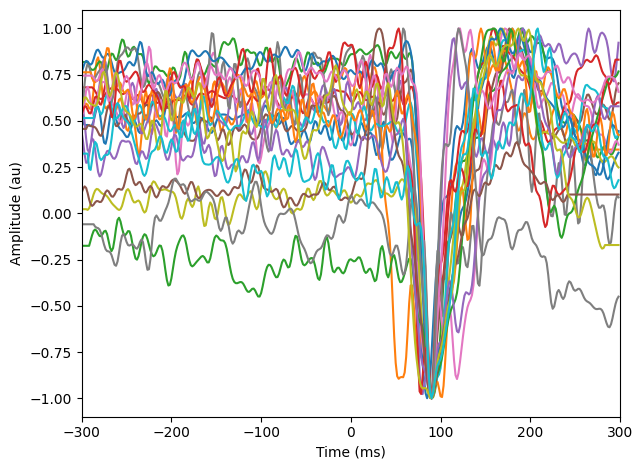

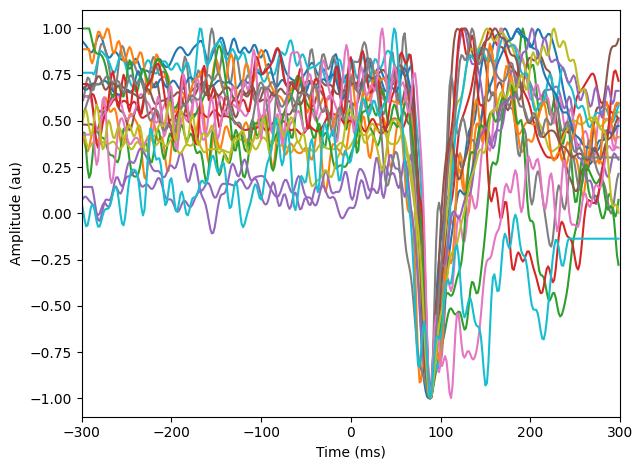

In [ ]:
# -------- LH --------
plt.figure()
plt.plot(ts_time, minmax_unit(all_lh_prior_ts[0]))
lh_lags, lh_align_idx, peaks, ref = align_to_abs_peak_with_edges_time(all_lh_prior_ts,
    start_time=-0.3,
    peak_window=(0.05, 0.15))

aligned_lh_prior_ts = []
aligned_lh_F_diff = []
aligned_lh_layer_F_diff = []
for i in range(all_lh_prior_ts.shape[0]):
    idx = lh_align_idx[i]
    if i > 0:
        plt.plot(ts_time, minmax_unit(all_lh_prior_ts[i, idx]))
    aligned_lh_prior_ts.append(all_lh_prior_ts[i, idx])
    aligned_lh_F_diff.append(all_lh_F_diff[i, :, idx])
    aligned_lh_layer_F_diff.append(all_lh_layer_F_diff[i, :, idx])

aligned_lh_prior_ts = np.asarray(aligned_lh_prior_ts)
aligned_lh_F_diff = np.transpose(np.asarray(aligned_lh_F_diff), (0, 2, 1))
#aligned_lh_F_diff_norm = normalize_layers_per_subject(aligned_lh_F_diff)
aligned_lh_layer_F_diff = np.transpose(np.asarray(aligned_lh_layer_F_diff), (0, 2, 1))
#aligned_lh_layer_F_diff_norm = normalize_layers_per_subject(aligned_lh_layer_F_diff)

plt.xlabel("Time (ms)")
plt.ylabel("Amplitude (au)")
plt.tight_layout(); plt.xlim(time_lims); plt.show()

# -------- RH --------
plt.figure()
plt.plot(ts_time, minmax_unit(all_rh_prior_ts[0]))
rh_lags, rh_align_idx, peaks, ref = align_to_abs_peak_with_edges_time(all_rh_prior_ts,
    start_time=-0.3,
    peak_window=(0.05, 0.15))

aligned_rh_prior_ts = []
aligned_rh_F_diff = []
aligned_rh_layer_F_diff = []
for i in range(all_rh_prior_ts.shape[0]):
    idx = rh_align_idx[i]
    if i > 0:
        plt.plot(ts_time, minmax_unit(all_rh_prior_ts[i, idx]))
    aligned_rh_prior_ts.append(all_rh_prior_ts[i, idx])
    aligned_rh_F_diff.append(all_rh_F_diff[i, :, idx])
    aligned_rh_layer_F_diff.append(all_rh_layer_F_diff[i, :, idx])

aligned_rh_prior_ts = np.asarray(aligned_rh_prior_ts)
aligned_rh_F_diff = np.transpose(np.asarray(aligned_rh_F_diff), (0, 2, 1))
#aligned_rh_F_diff_norm = normalize_layers_per_subject(aligned_lh_F_diff)
aligned_rh_layer_F_diff = np.transpose(np.asarray(aligned_rh_layer_F_diff), (0, 2, 1))
#aligned_rh_layer_F_diff_norm = normalize_layers_per_subject(aligned_rh_layer_F_diff)

plt.xlabel("Time (ms)")
plt.ylabel("Amplitude (au)")
plt.tight_layout(); plt.xlim(time_lims); plt.show()

In [19]:
ra_aligned_rh_F_diff = aligned_rh_F_diff
ra_aligned_rh_layer_F_diff = aligned_rh_layer_F_diff
ra_aligned_lh_F_diff = aligned_lh_F_diff
ra_aligned_lh_layer_F_diff = aligned_lh_layer_F_diff

In [23]:
la_aligned_rh_F_diff = aligned_rh_F_diff
la_aligned_rh_layer_F_diff = aligned_rh_layer_F_diff
la_aligned_lh_F_diff = aligned_lh_F_diff
la_aligned_lh_layer_F_diff = aligned_lh_layer_F_diff

In [ ]:

savemat('aligned_data_ERF_F.mat', {
    'la_aligned_rh_F_diff': la_aligned_rh_F_diff,
    'la_aligned_rh_layer_F_diff': la_aligned_rh_layer_F_diff,
    'la_aligned_lh_F_diff': la_aligned_lh_F_diff,
    'la_aligned_lh_layer_F_diff': la_aligned_lh_layer_F_diff,

    'ra_aligned_rh_F_diff': ra_aligned_rh_F_diff,
    'ra_aligned_rh_layer_F_diff': ra_aligned_rh_layer_F_diff,
    'ra_aligned_lh_F_diff': ra_aligned_lh_F_diff,
    'ra_aligned_lh_layer_F_diff': ra_aligned_lh_layer_F_diff
})